In [40]:
#Import the necessary dependencies
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout, Conv2D, MaxPooling2D, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import seaborn as sns

In [41]:
#Data importation
df = pd.read_csv("/kaggle/input/netflix-stock-price-2002-2025/Netflix Inc. (NFLX) Stock Price 2002-2025.csv")
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,"Feb 25, 2025",989.4,994.4,955,977.24,977.24,"4,733,000"
1,"Feb 24, 2025","1,008.00","1,015.17",984.48,988.47,988.47,"4,426,200"
2,"Feb 21, 2025","1,029.42","1,032.38",999.39,"1,003.15","1,003.15","3,738,700"
3,"Feb 20, 2025","1,042.00","1,045.00","1,015.59","1,024.54","1,024.54","3,111,800"
4,"Feb 19, 2025","1,035.18","1,045.00","1,024.51","1,043.33","1,043.33","2,600,000"


In [42]:
df["Date"] = pd.to_datetime(df["Date"])  # Convert Date column to datetime format
df = df.sort_values(by="Date")  # Ensure chronological order
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
5728,2002-05-23,1.16,1.24,1.15,1.2,1.2,"104,790,000"
5727,2002-05-24,1.21,1.23,1.2,1.21,1.21,"11,104,800"
5726,2002-05-28,1.21,1.23,1.16,1.16,1.16,"6,609,400"
5725,2002-05-29,1.16,1.16,1.09,1.1,1.1,"6,757,800"
5724,2002-05-30,1.11,1.11,1.07,1.07,1.07,"10,154,200"


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5729 entries, 5728 to 0
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       5729 non-null   datetime64[ns]
 1   Open       5729 non-null   object        
 2   High       5727 non-null   object        
 3   Low        5727 non-null   object        
 4   Close      5727 non-null   object        
 5   Adj Close  5727 non-null   object        
 6   Volume     5727 non-null   object        
dtypes: datetime64[ns](1), object(6)
memory usage: 358.1+ KB


In [44]:
# Convert price columns to numeric, forcing errors='coerce' to handle missing values
numeric_cols = ["Open ", "High", "Low", "Close", "Adj Close", "Volume"]
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')
# Check the updated data types
print(df.dtypes)

Date         datetime64[ns]
Open                float64
High                float64
Low                 float64
Close               float64
Adj Close           float64
Volume              float64
dtype: object


In [45]:
df.isnull().sum()

Date            0
Open           14
High           16
Low            11
Close          14
Adj Close      14
Volume       5729
dtype: int64

In [46]:
#Filling the missing values
df.fillna(method='ffill', inplace=True)  # Forward fill missing values
df = df.drop("Volume", axis=1)
df.isnull().sum()

<ipython-input-46-6ed0b74694fc>:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)  # Forward fill missing values


Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
dtype: int64

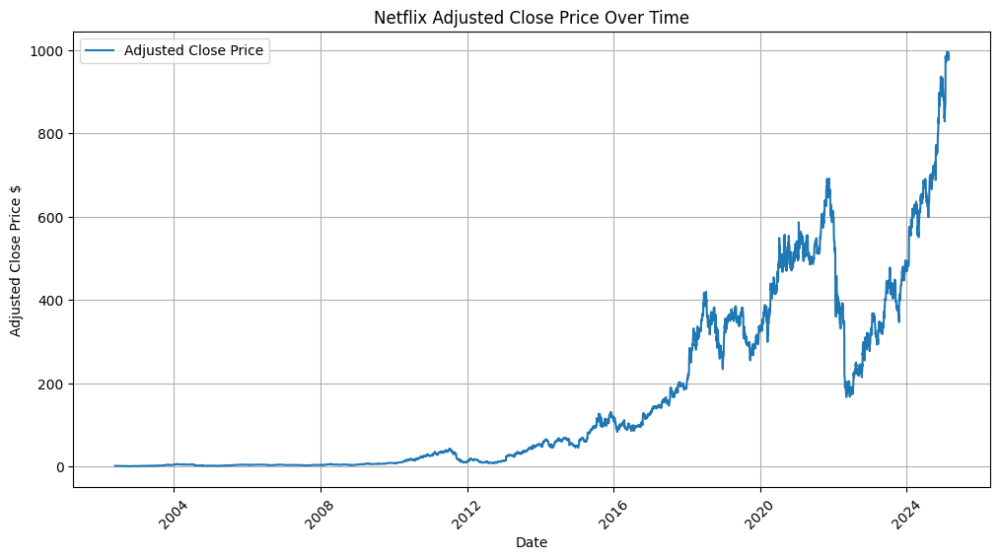

In [47]:
plt.figure(figsize=(12, 6))
plt.plot(df["Date"], df["Adj Close"], label='Adjusted Close Price')
plt.title('Netflix Adjusted Close Price Over Time')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price $')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

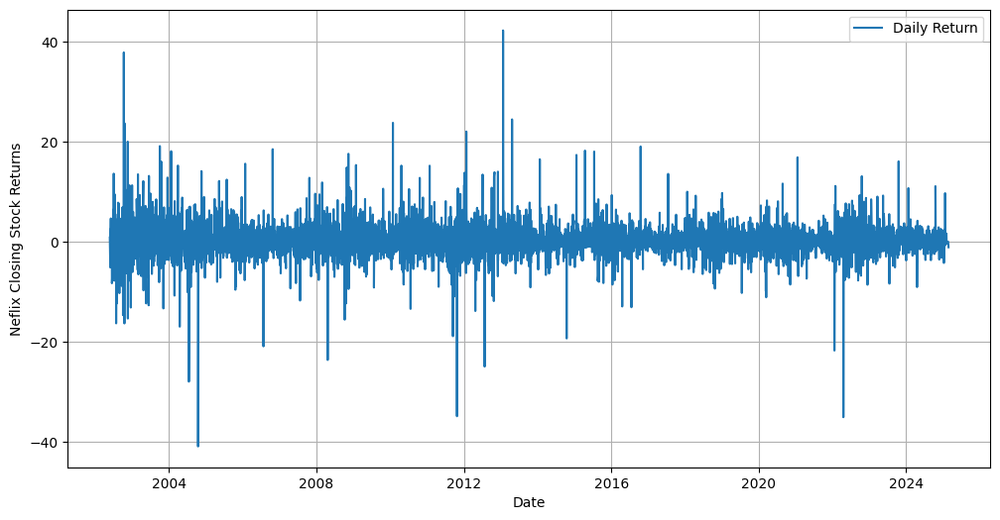

In [48]:
df["Daily_Return"] = df["Adj Close"].pct_change() * 100
plt.figure(figsize=(12, 6))
plt.plot(df['Date'], df["Daily_Return"], label= "Daily Return")
plt.xlabel('Date')
plt.ylabel('Neflix Closing Stock Returns')
plt.legend()
plt.grid(True)
plt.show()

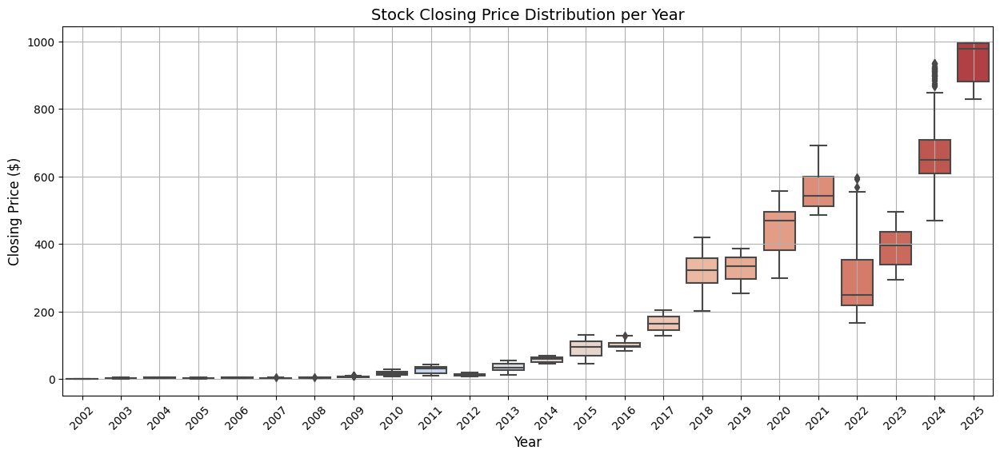

In [49]:
# Extract Year from Date
df["Year"] = df["Date"].dt.year
# Plot Box Plot
plt.figure(figsize=(15, 6))
sns.boxplot(x=df["Year"], y=df["Adj Close"], palette="coolwarm")
# Labels & Formatting
plt.title("Stock Closing Price Distribution per Year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Closing Price ($)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)

**USING LSTM**

Processing ticker: NFLX
Training with learning rate: 0.0001
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0449 - val_loss: 0.0017
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0031 - val_loss: 4.6105e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0022 - val_loss: 3.6774e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018 - val_loss: 4.4425e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018 - val_loss: 3.2877e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0017 - val_loss: 3.1922e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0014 - val_loss: 3.1001e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0015 - val_loss: 3.5942e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016 - val_loss: 3.2620e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013 - val_loss: 3.1150e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014 - val_loss: 5.0670e-04
Epoch 12/50
57/57 ━━━━━━━━━━━━━━━━

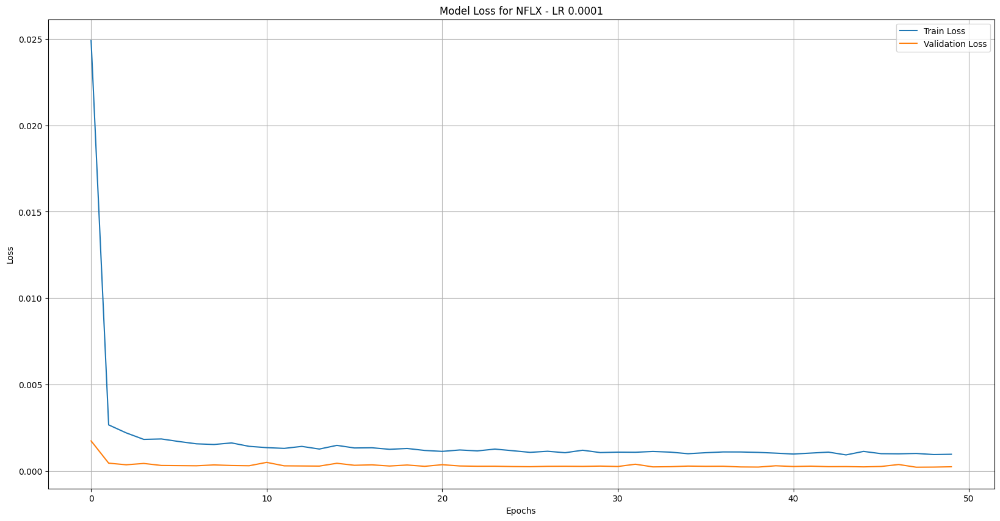

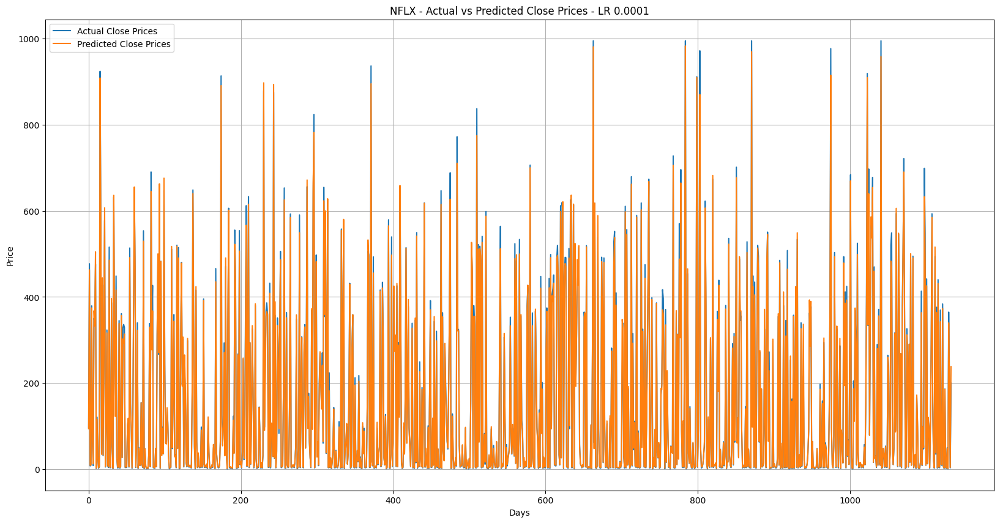

Training with learning rate: 0.001
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0121 - val_loss: 5.0708e-04
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0015 - val_loss: 2.5392e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0014 - val_loss: 4.1425e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0013 - val_loss: 2.4244e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012 - val_loss: 5.9976e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012 - val_loss: 2.9935e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012 - val_loss: 4.3462e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 3.2380e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0010 - val_loss: 2.4044e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.3711e-04 - val_loss: 3.1245e-04
Epoch 12/50
57/57 ━━━━━━━━━━━━

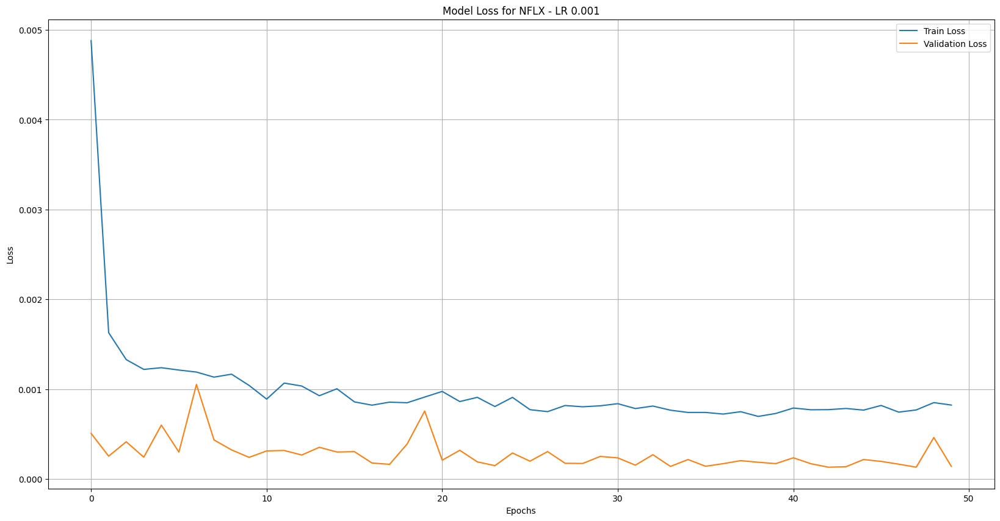

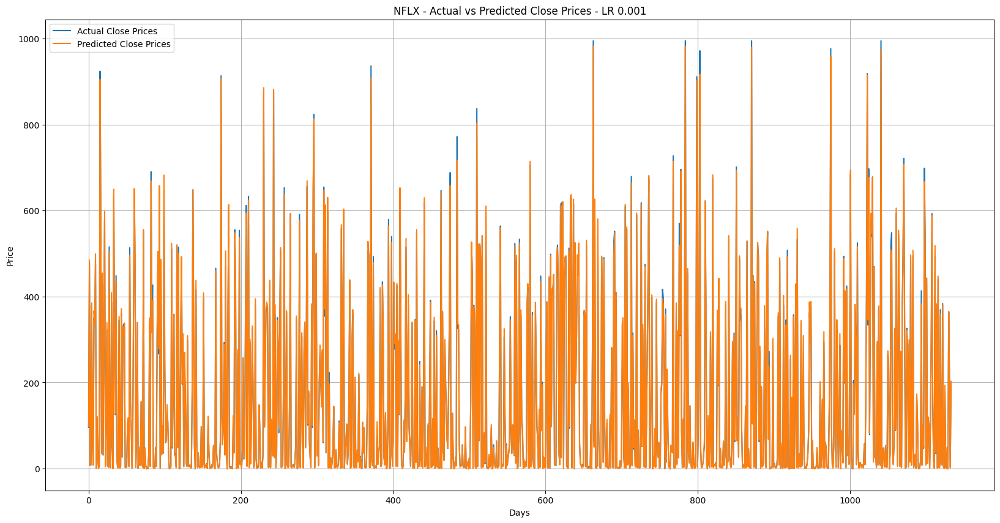

Training with learning rate: 0.01
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0243 - val_loss: 8.3654e-04
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0020 - val_loss: 3.5317e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015 - val_loss: 2.1217e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013 - val_loss: 1.3574e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012 - val_loss: 3.3626e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0013 - val_loss: 1.8498e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012 - val_loss: 0.0010
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 1.5062e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.3846e-04 - val_loss: 5.6319e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0010 - val_loss: 1.8613e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013 - val_loss: 5.2246e-04
Epoch 12/50
57/57 ━━━━━━━━━━━━

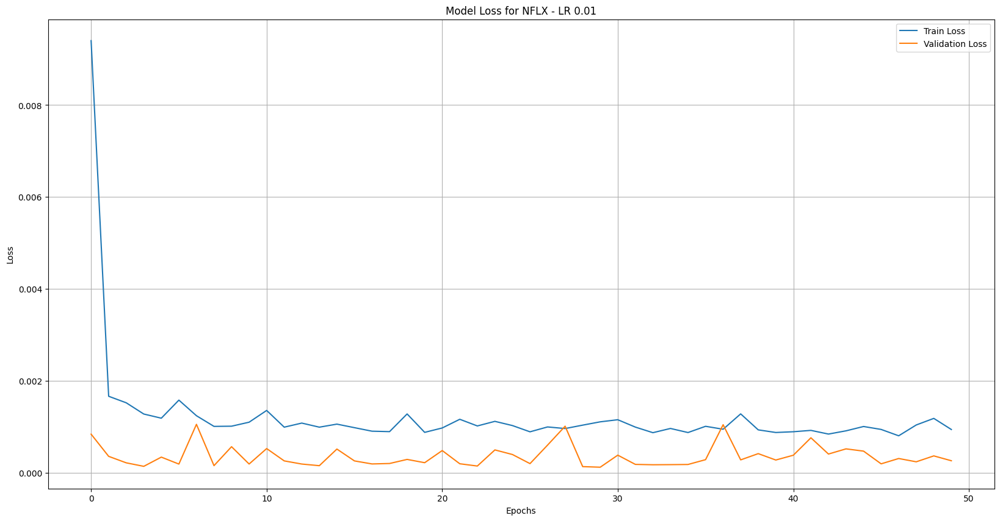

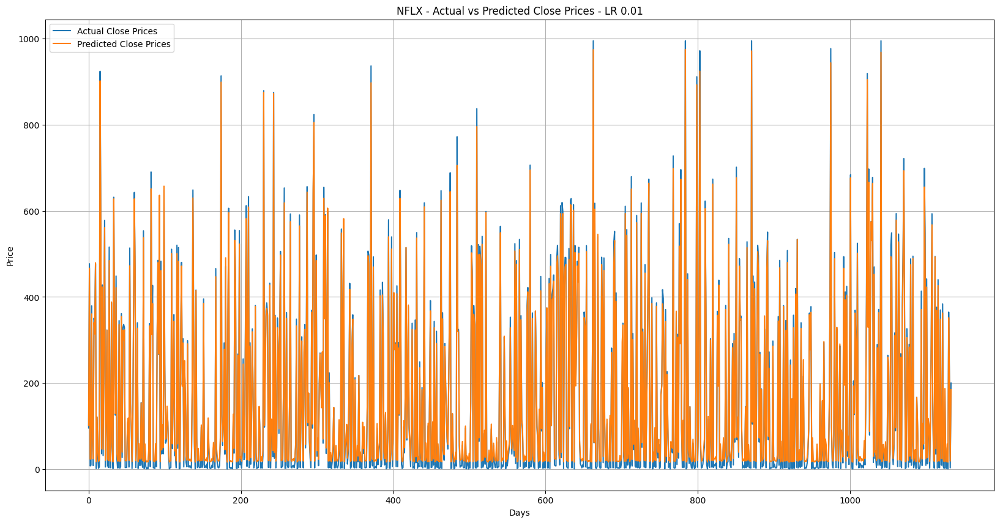

Training with learning rate: 0.1
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 7.7688 - val_loss: 0.0721
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0700 - val_loss: 0.0479
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0600 - val_loss: 0.0519
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0699 - val_loss: 0.0475
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0556 - val_loss: 0.0612
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0563 - val_loss: 0.0485
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0590 - val_loss: 0.0482
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0588 - val_loss: 0.0508
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0728 - val_loss: 0.0492
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0573 - val_loss: 0.0475
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0637 - val_loss: 0.0556
Epoch 12/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0608 - val_l

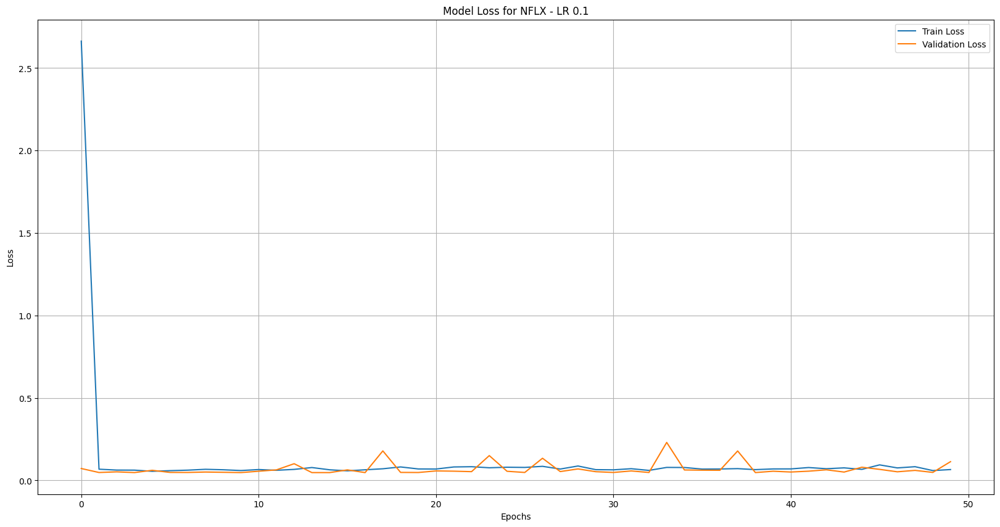

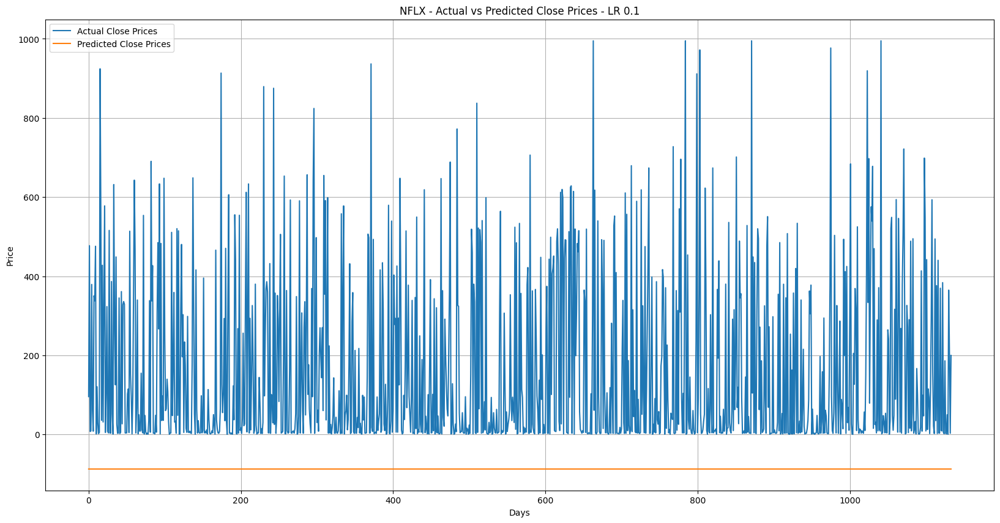

          0.0001      0.0010      0.0100     0.1000
0      93.912781   98.151535  102.105408 -87.135155
1     462.889832  484.997711  466.681366 -87.135048
2       9.076118    6.951223   23.132507 -87.135216
3       9.692151    8.057671   24.287205 -87.135216
4     374.436951  385.156006  360.556641 -87.135078
...          ...         ...         ...        ...
1129    1.857033   -0.911535   16.576683 -87.135216
1130  339.867584  364.656586  351.855560 -87.135078
1131  182.355209  194.623596  193.554474 -87.135124
1132    4.339716    1.882759   19.023926 -87.135216
1133  238.326691  202.689529  184.723206 -87.135048

[1134 rows x 4 columns]


In [50]:
def fit_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Netflix.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: NFLX")
    ticker_data = df["Adj Close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # LSTM model
        model = Sequential()
        model.add(LSTM(100, return_sequences=True, input_shape=(look_back, 1)))
        model.add(Dropout(0.5))
        model.add(LSTM(100, return_sequences=False))
        model.add(Dropout(0.5))
        model.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"NFLX - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': model,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for NFLX - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'NFLX - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_lstm_individual(df)
print(prediction)

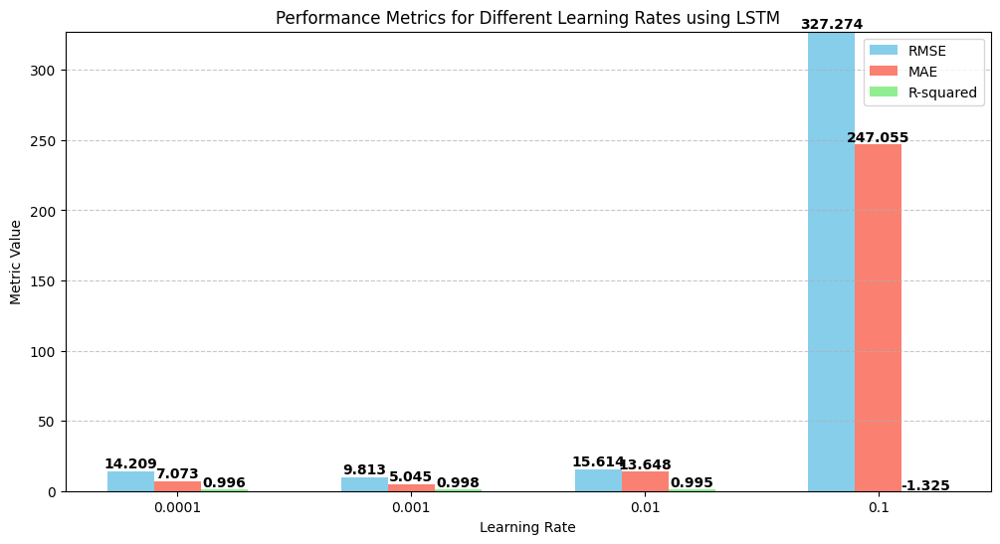

In [51]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(12, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using LSTM')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')

ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)

plt.show()

**USING CNN+GRU-LSTM**

Processing ticker: NFLX
Training with learning rate: 0.0001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0375 - val_loss: 8.3918e-04
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0016 - val_loss: 8.1420e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0014 - val_loss: 7.3323e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0014 - val_loss: 5.4864e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0013 - val_loss: 4.7171e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0014 - val_loss: 4.8071e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0013 - val_loss: 4.4222e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0012 - val_loss: 4.1299e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 9.4527e-04 - val_loss: 4.2263e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 8.9921e-04 - val_loss: 3.8468e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0010 - val_loss: 3.7708e-04
Epoch 12/

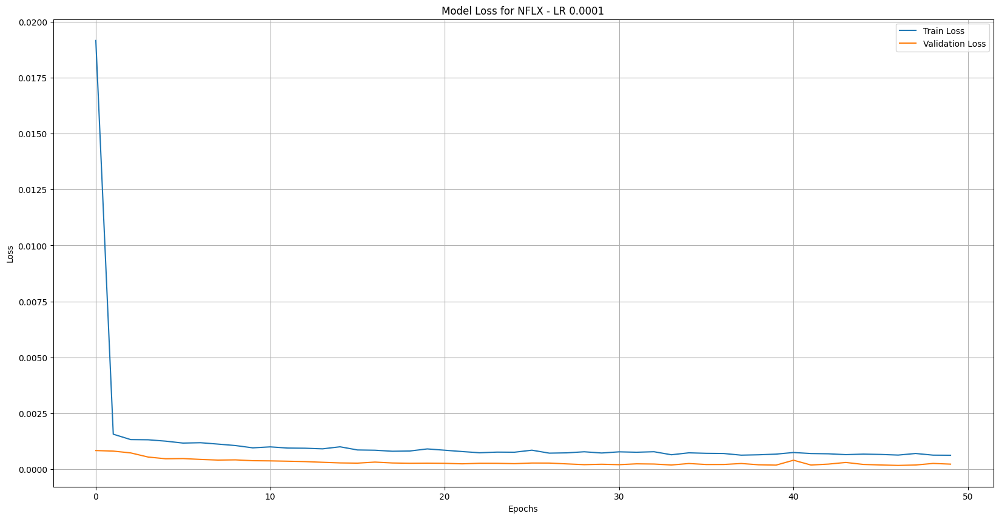

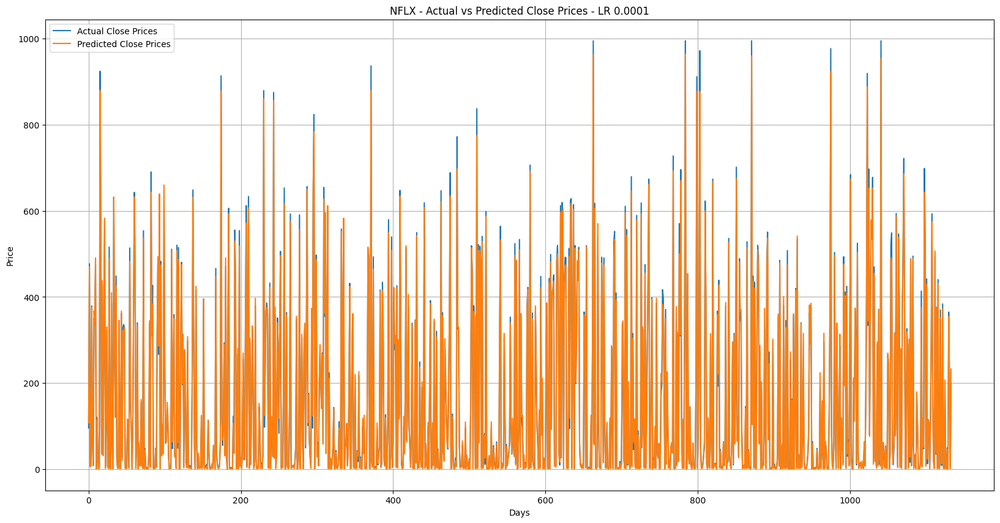

Training with learning rate: 0.001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0128 - val_loss: 5.3851e-04
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0012 - val_loss: 6.4374e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0012 - val_loss: 3.3085e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0011 - val_loss: 4.4192e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0010 - val_loss: 3.5659e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0011 - val_loss: 3.6760e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 8.5085e-04 - val_loss: 4.3175e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0011 - val_loss: 4.2338e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 9.2560e-04 - val_loss: 3.5285e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0011 - val_loss: 2.0619e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 8.8662e-04 - val_loss: 4.0511e-04
Epoch

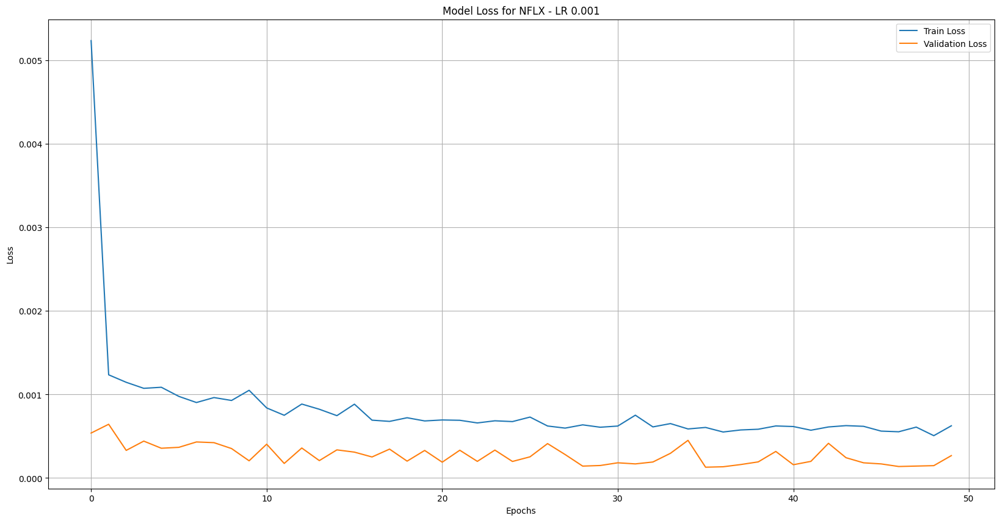

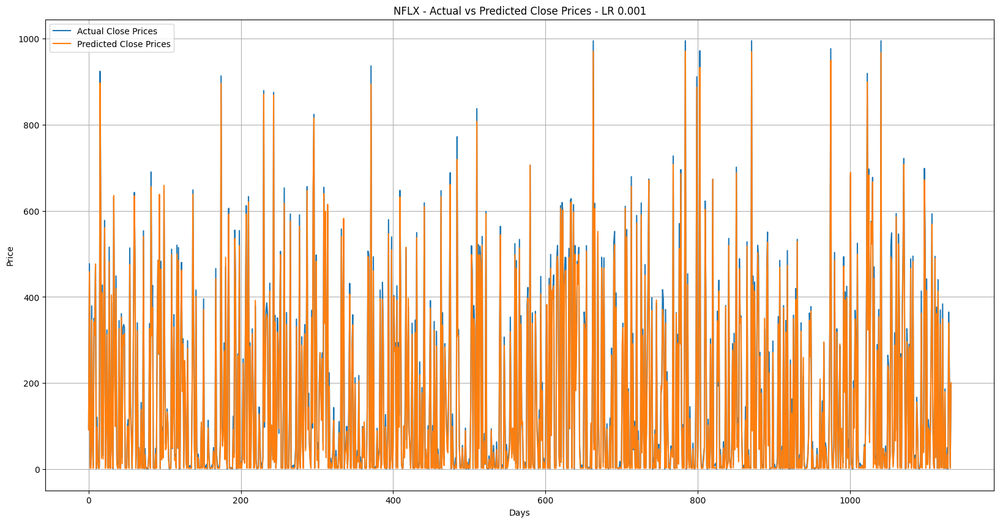

Training with learning rate: 0.01


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.0699 - val_loss: 0.0012
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0019 - val_loss: 8.9455e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0013 - val_loss: 6.9430e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0014 - val_loss: 5.7248e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0012 - val_loss: 3.8144e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0010 - val_loss: 2.2310e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 7.8261e-04 - val_loss: 2.4743e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 9.4038e-04 - val_loss: 9.1010e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0011 - val_loss: 2.5673e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 9.3291e-04 - val_loss: 3.3127e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0020 - val_loss: 0.0011
Epoch 12/50
5

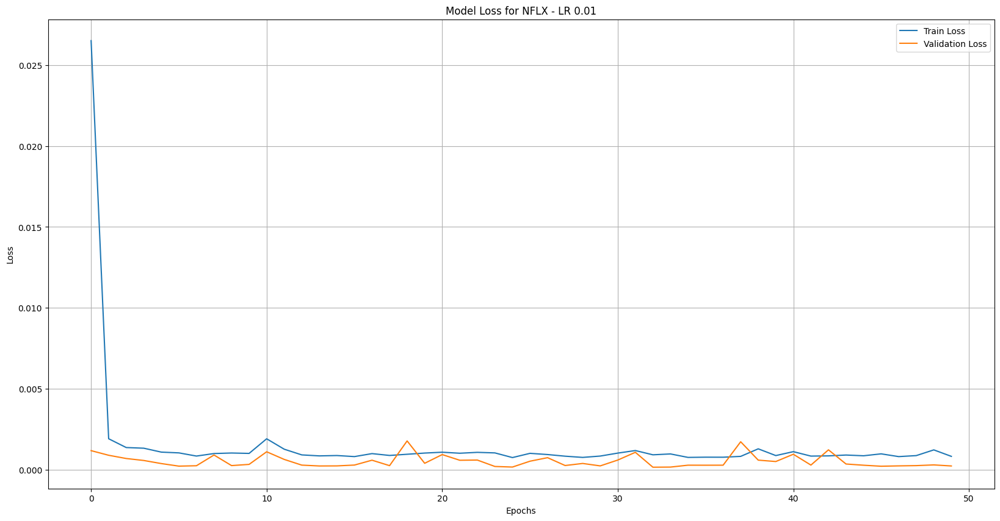

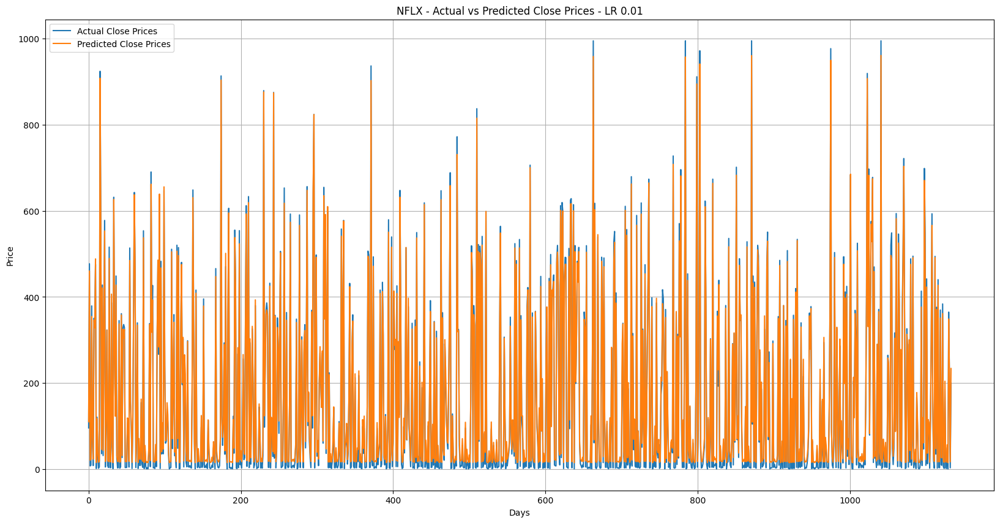

Training with learning rate: 0.1


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 8.1335 - val_loss: 0.0807
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0961 - val_loss: 0.0490
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0682 - val_loss: 0.0475
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0698 - val_loss: 0.0498
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0712 - val_loss: 0.0474
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.1133 - val_loss: 0.0622
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.2299 - val_loss: 0.0596
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.1691 - val_loss: 0.4065
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.4764 - val_loss: 0.0880
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.1542 - val_loss: 0.1410
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0904 - val_loss: 0.0560
Epoch 12/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0

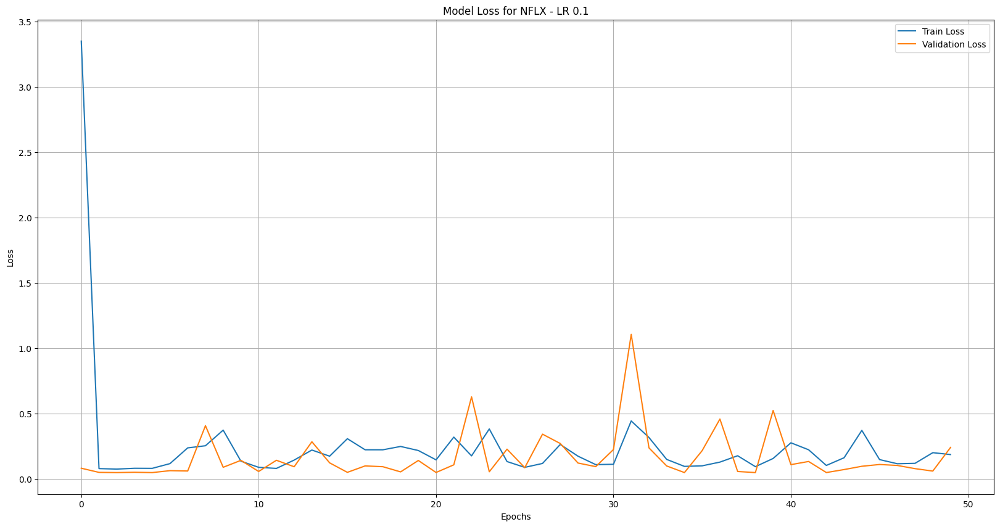

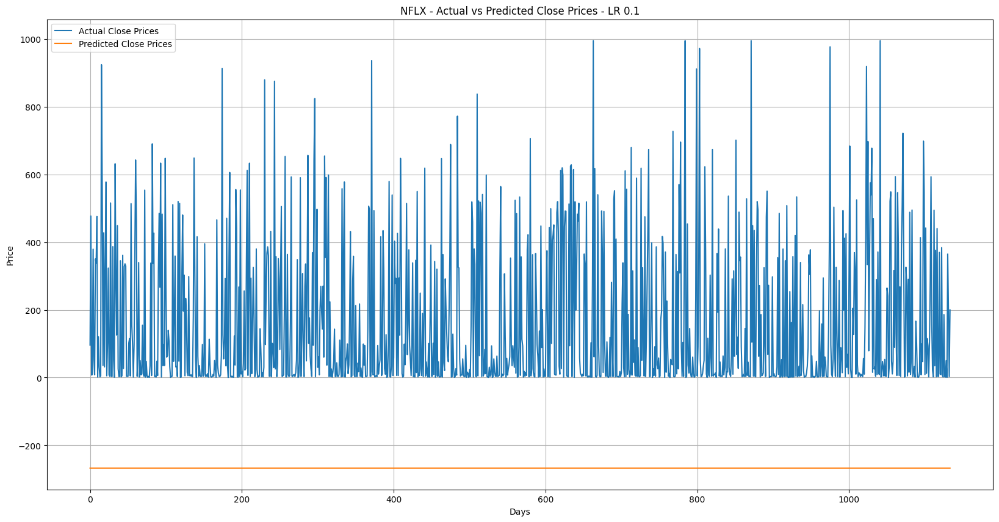

          0.0001      0.0010      0.0100      0.1000
0     107.507103   90.938232  110.288513 -267.260498
1     470.006561  458.492737  460.410492 -267.260498
2       5.505430    2.420281   20.868250 -267.260498
3       7.677357    2.376342   23.064753 -267.260498
4     375.652618  346.960968  354.540985 -267.260498
...          ...         ...         ...         ...
1129    0.694550    2.321022   15.269970 -267.260498
1130  354.657074  339.707306  348.812897 -267.260498
1131  201.339859  181.674973  203.656448 -267.260498
1132    1.323132    2.321052   17.234612 -267.260498
1133  232.586533  200.512436  233.874847 -267.260498

[1134 rows x 4 columns]


In [53]:
def fit_cnn_gru_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+GRU-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Netflix.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: NFLX")
    ticker_data = df["Adj Close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN+GRU-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        cgl= Sequential()
        cgl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        cgl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cgl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        cgl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cgl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        cgl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cgl.add(TimeDistributed(Flatten()))
        cgl.add(Bidirectional(GRU(100, return_sequences=True)))
        cgl.add(Dropout(0.5))
        cgl.add(Bidirectional(LSTM(100, return_sequences=False)))
        cgl.add(Dropout(0.5))
        cgl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        cgl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = cgl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = cgl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"NFLX - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': cgl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for NFLX - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'NFLX - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_gru_lstm_individual(df)
print(prediction)

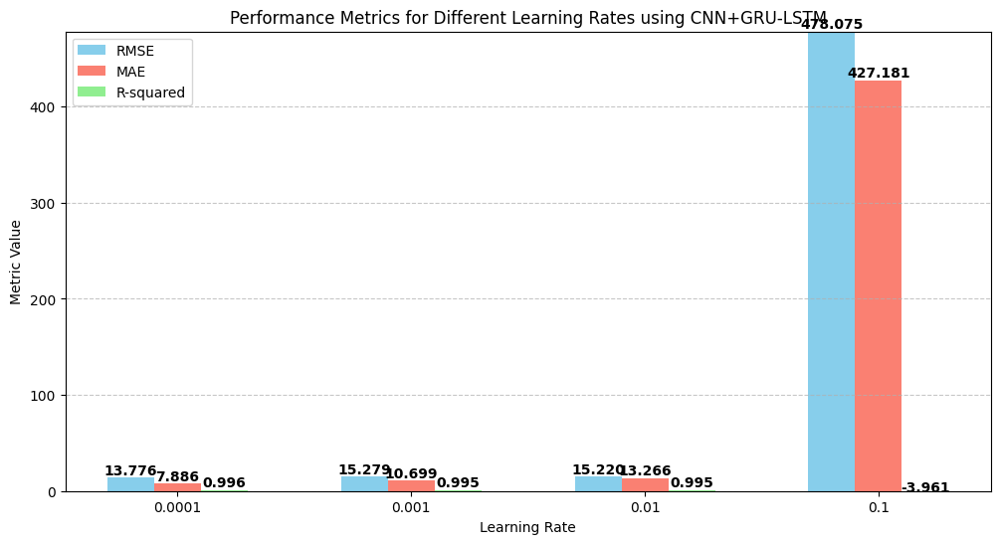

In [54]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(12, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using CNN+GRU-LSTM')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')

ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)

plt.show()

**CNN+BI-LSTM**

Processing ticker: NFLX
Training with learning rate: 0.0001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0338 - val_loss: 9.6737e-04
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0017 - val_loss: 7.4584e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0016 - val_loss: 7.2033e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0017 - val_loss: 6.1127e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0013 - val_loss: 5.6745e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0013 - val_loss: 5.3371e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0011 - val_loss: 4.9181e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 0.0011 - val_loss: 4.7529e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0011 - val_loss: 4.4734e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0010 - val_loss: 7.1524e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0011 - val_loss: 6.3566e-04
Epoch 12/50
57/57

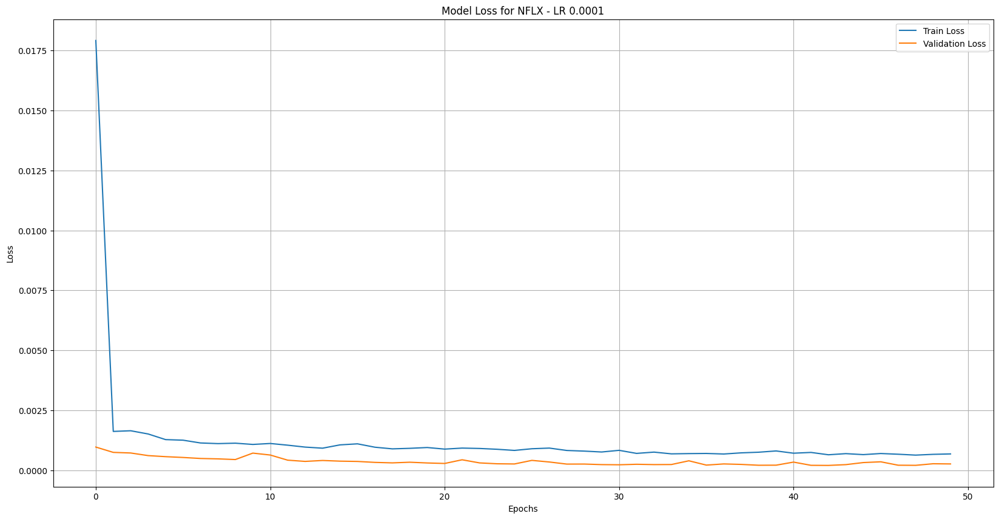

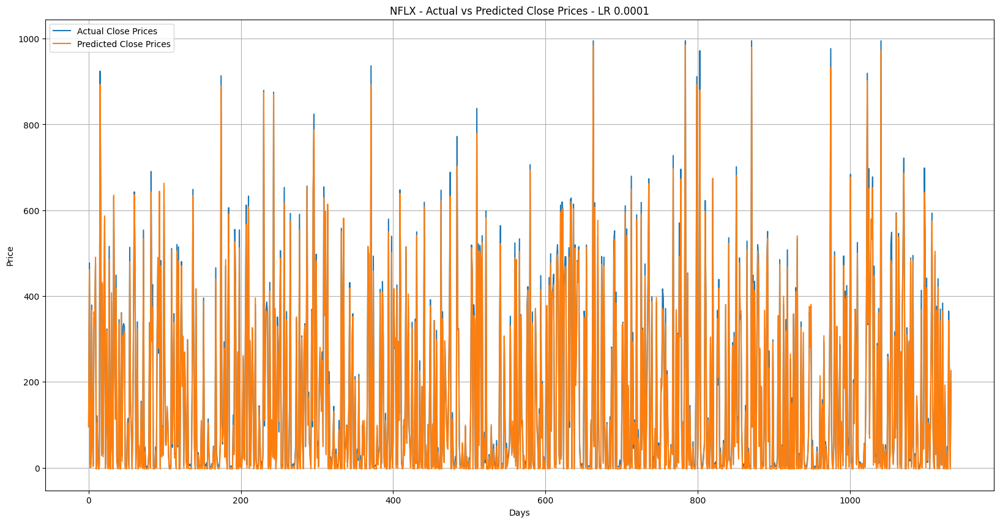

Training with learning rate: 0.001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0162 - val_loss: 7.0543e-04
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 0.0012 - val_loss: 3.8838e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0010 - val_loss: 4.4765e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 0.0011 - val_loss: 4.3286e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0012 - val_loss: 3.0333e-04
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 9.2681e-04 - val_loss: 5.7646e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0011 - val_loss: 4.2091e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0013 - val_loss: 2.4081e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 8.2876e-04 - val_loss: 2.6166e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 8.1900e-04 - val_loss: 8.6865e-04
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 8.9141e-04 - val_loss: 2.2461e-04
E

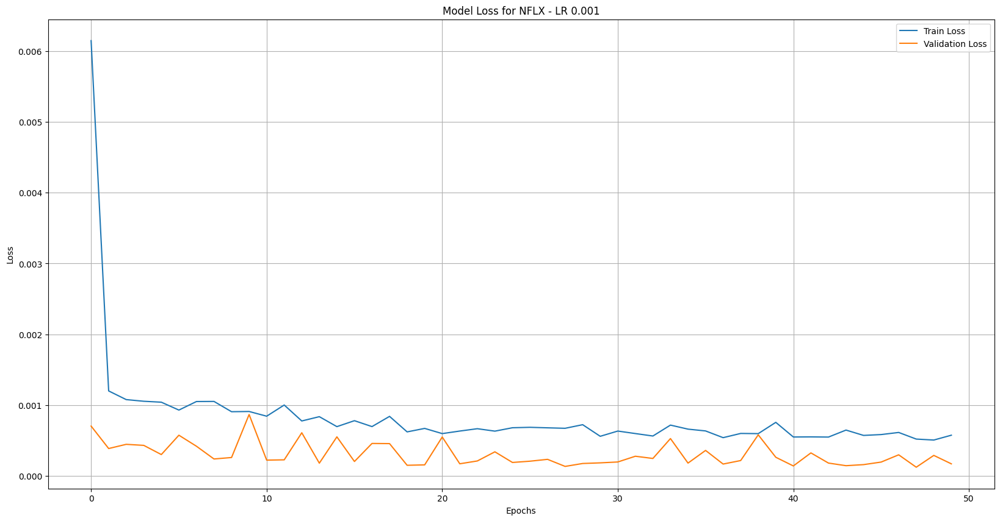

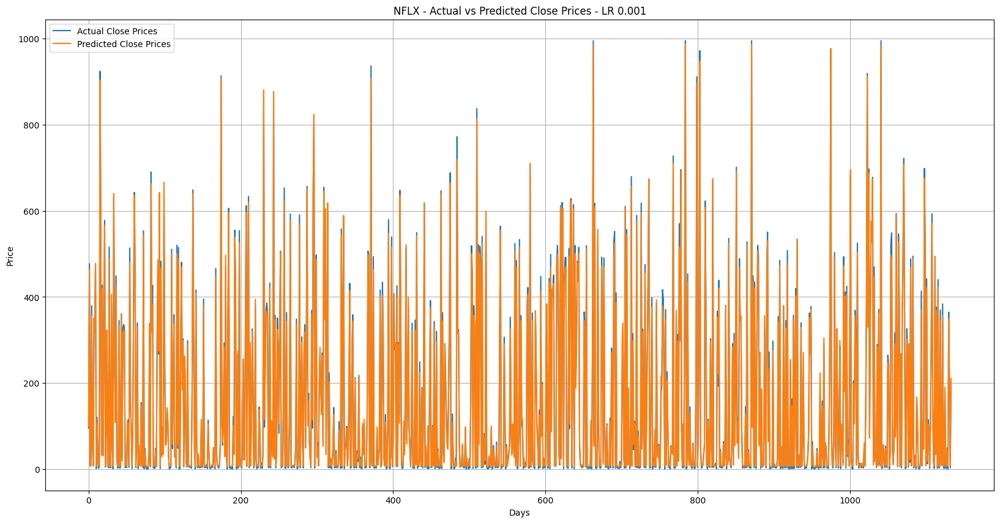

Training with learning rate: 0.01


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.0335 - val_loss: 0.0019
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0019 - val_loss: 4.5469e-04
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0014 - val_loss: 7.6562e-04
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0013 - val_loss: 5.6536e-04
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.0010 - val_loss: 0.0017
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0015 - val_loss: 6.9956e-04
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0011 - val_loss: 2.5660e-04
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0010 - val_loss: 4.0704e-04
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0011 - val_loss: 4.9870e-04
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 0.0010 - val_loss: 0.0010
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0013 - val_loss: 3.1289e-04
Epoch 12/50
57/57 ━━━━━━━━━━━

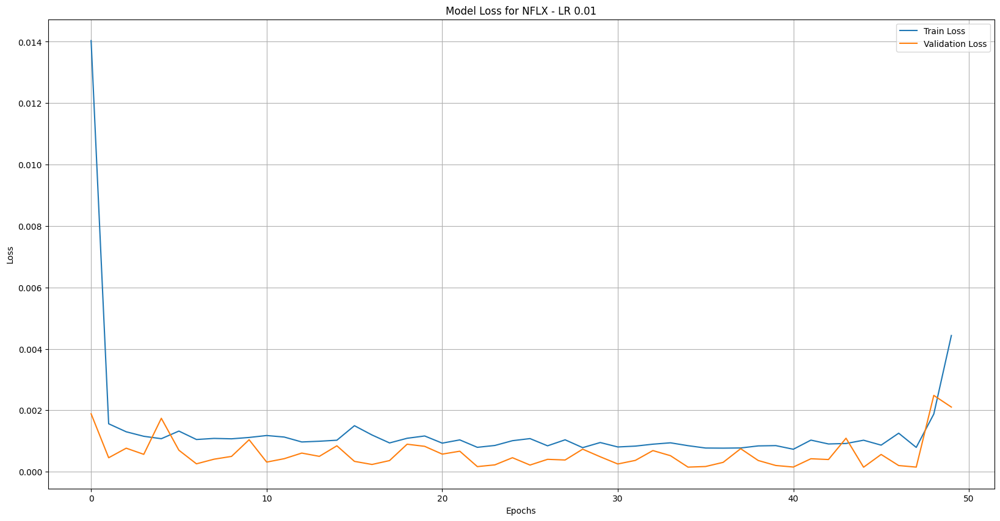

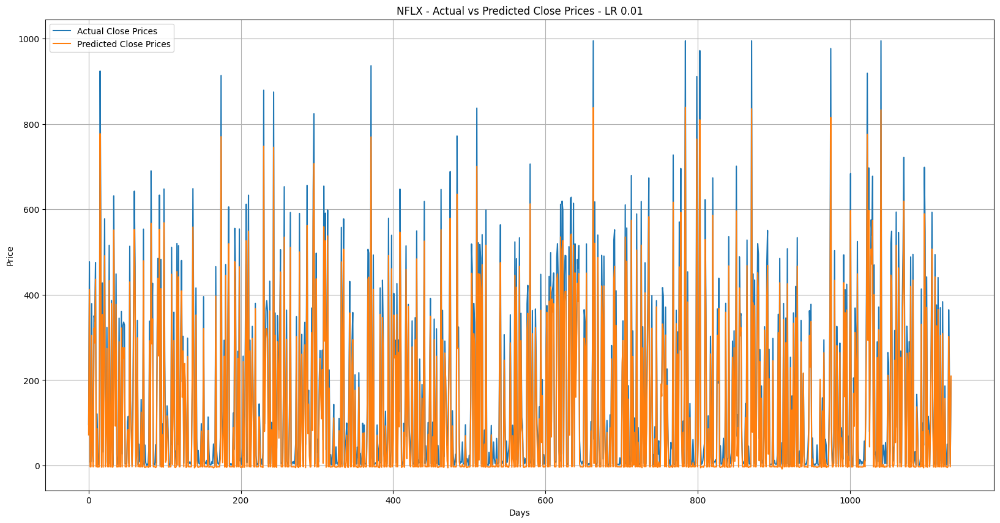

Training with learning rate: 0.1


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 18.1426 - val_loss: 0.0578
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0779 - val_loss: 0.0480
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0624 - val_loss: 0.0502
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0597 - val_loss: 0.0498
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0591 - val_loss: 0.0520
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0576 - val_loss: 0.0483
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.0618 - val_loss: 0.0525
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0521 - val_loss: 0.0541
Epoch 9/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0528 - val_loss: 0.0546
Epoch 10/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0537 - val_loss: 0.0480
Epoch 11/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0560 - val_loss: 0.0639
Epoch 12/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 

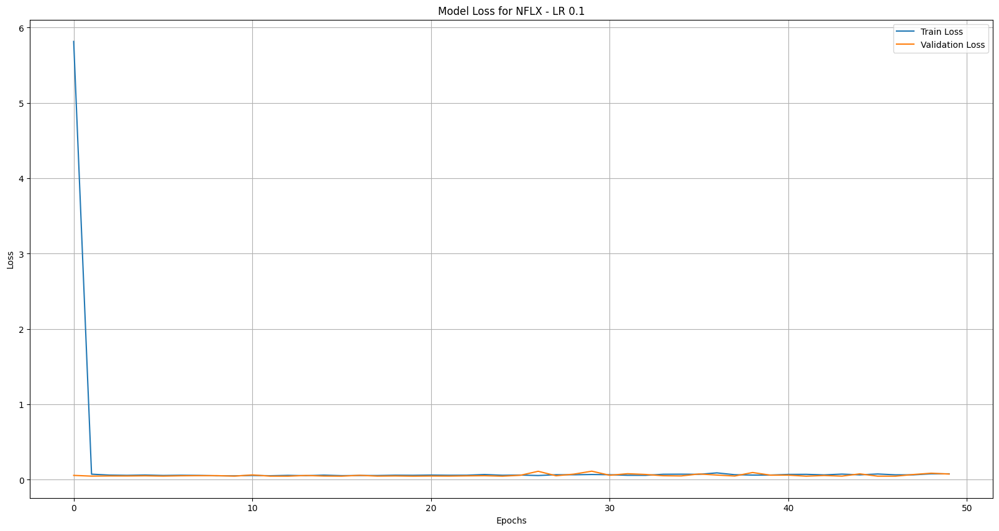

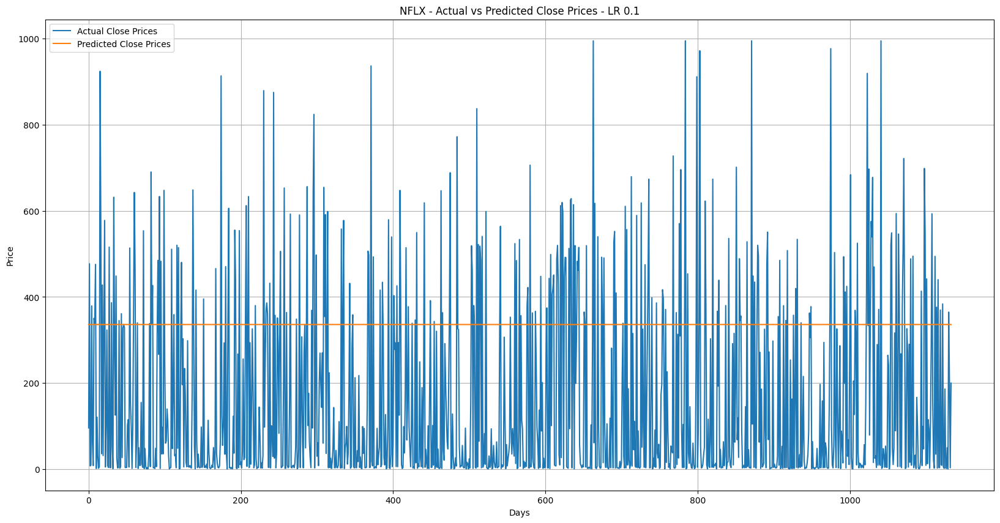

          0.0001      0.0010      0.0100      0.1000
0      96.325432   99.329903   71.814224  335.990845
1     461.816528  463.657715  412.154755  335.990845
2       0.145895    7.234596   -3.139529  335.990845
3       1.778927    7.496585   -3.233275  335.990845
4     367.746490  356.239014  304.579865  335.990845
...          ...         ...         ...         ...
1129   -2.886741    7.187116   -3.096464  335.990845
1130  343.538269  348.950562  302.466187  335.990845
1131  187.103683  190.001404  161.515793  335.990845
1132   -2.491307    7.178758   -3.101918  335.990845
1133  226.252289  210.891830  209.485168  335.990845

[1134 rows x 4 columns]


In [55]:
def fit_cnn_bi_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+BI-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Netflix.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: NFLX")
    ticker_data = df["Adj Close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN+Bi-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+Bi-LSTM model
        cl = Sequential()
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Flatten()))
        cl.add(Bidirectional(LSTM(100, return_sequences=True)))
        cl.add(Dropout(0.5))
        cl.add(Bidirectional(LSTM(100, return_sequences=False)))
        cl.add(Dropout(0.5))
        cl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        cl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = cl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = cl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"NFLX - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': cl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for NFLX - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'NFLX - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_bi_lstm_individual(df)
print(prediction)

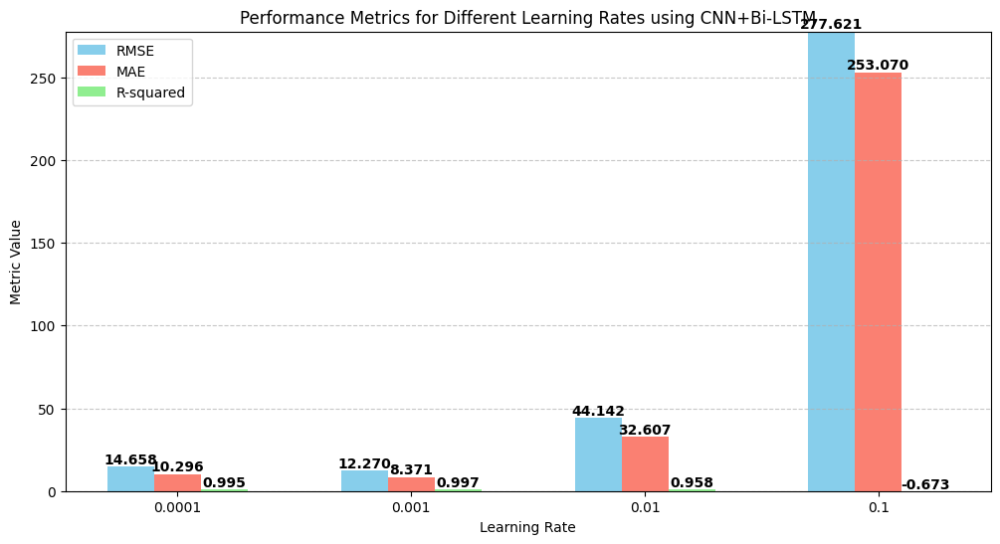

In [57]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(12, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using CNN+Bi-LSTM')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')

ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)

plt.show()

**USING BATCH SIZE OF 128**

**LSTM**

Processing ticker: NFLX
Training with learning rate: 0.0001
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0421 - val_loss: 0.0031
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0044 - val_loss: 0.0010
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0022 - val_loss: 4.6235e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0019 - val_loss: 5.3167e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0020 - val_loss: 4.3330e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0019 - val_loss: 3.6534e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018 - val_loss: 3.0894e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0019 - val_loss: 3.6146e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0016 - val_loss: 3.1353e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0016 - val_loss: 3.0495e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0018 - val_loss: 3.0810e-04
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━

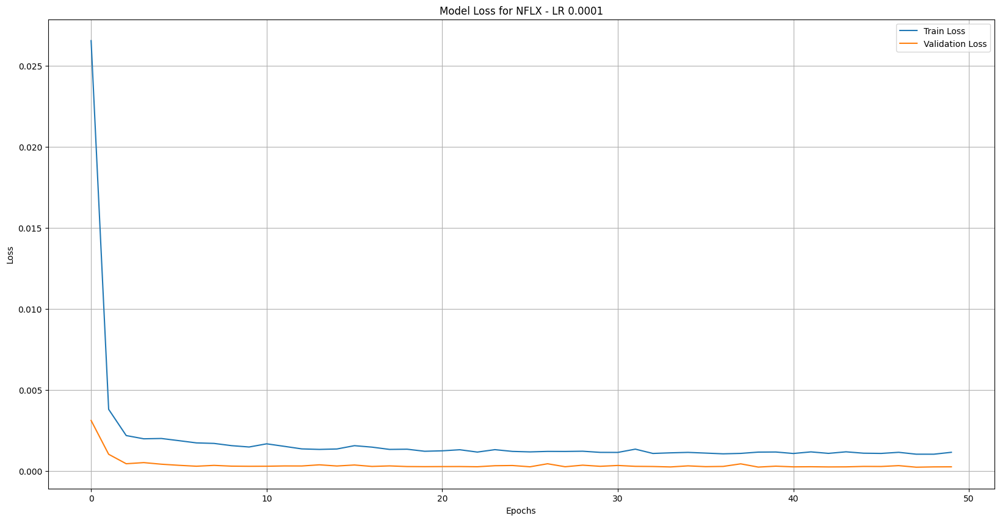

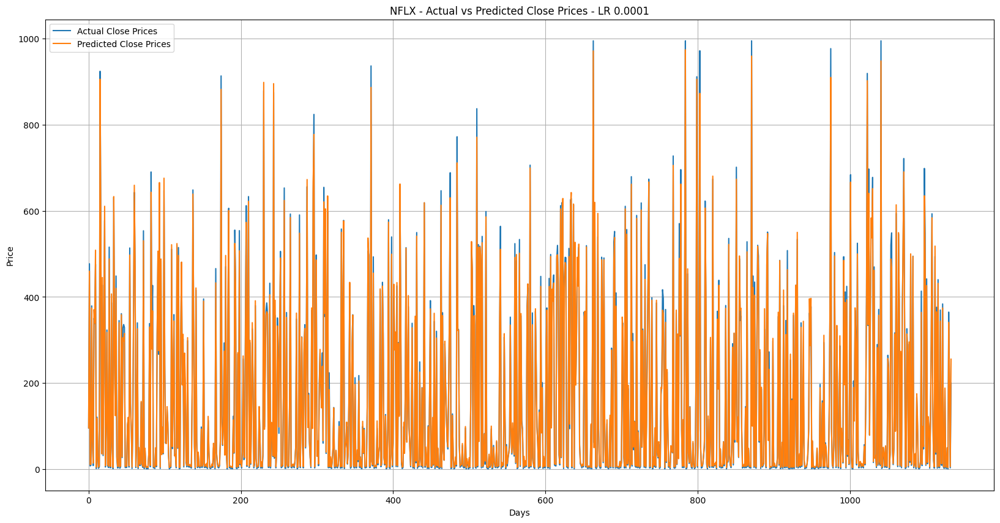

Training with learning rate: 0.001
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0167 - val_loss: 3.5740e-04
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0017 - val_loss: 5.4501e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018 - val_loss: 3.0395e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0014 - val_loss: 2.5603e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013 - val_loss: 3.2223e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013 - val_loss: 4.2226e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0012 - val_loss: 2.5510e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0012 - val_loss: 2.3436e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0011 - val_loss: 2.1997e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0011 - val_loss: 3.3328e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0010 - val_loss: 2.1923e-04
Epoch 12/50
29/29 ━━━━━━━━━━━━

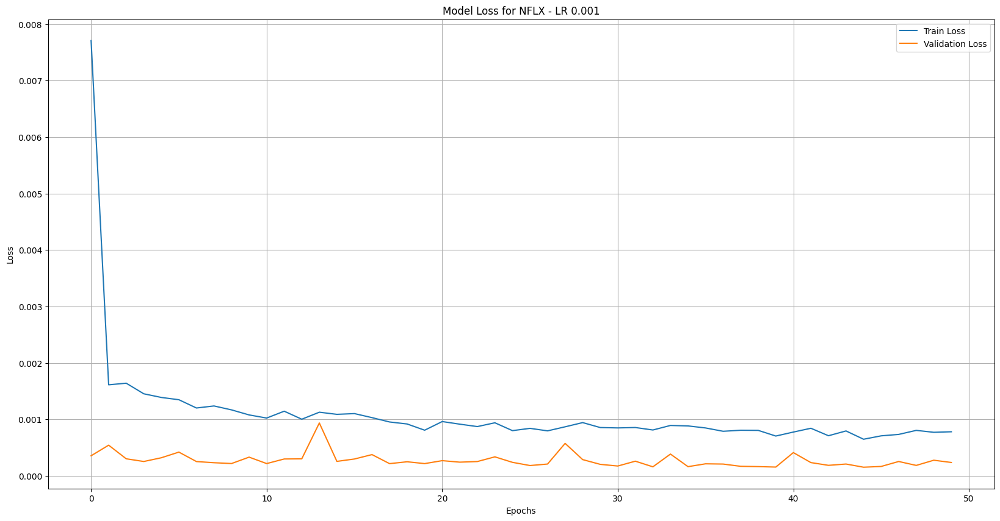

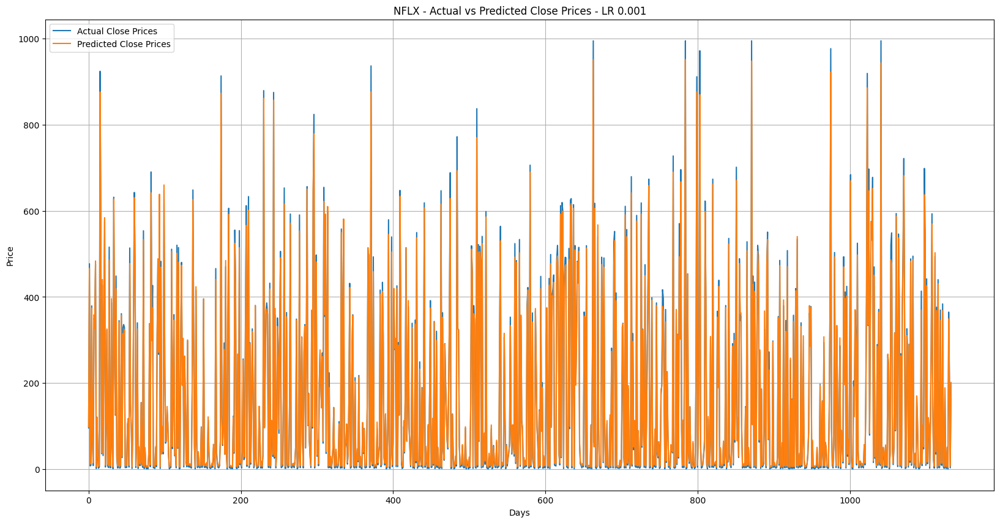

Training with learning rate: 0.01
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0424 - val_loss: 0.0013
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0016 - val_loss: 2.1776e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0016 - val_loss: 2.5973e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0015 - val_loss: 3.4740e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0012 - val_loss: 3.6413e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0011 - val_loss: 2.8411e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0011 - val_loss: 7.1805e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.7012e-04 - val_loss: 1.8118e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0012 - val_loss: 3.1773e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0011 - val_loss: 3.1149e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 9.7234e-04 - val_loss: 1.9398e-04
Epoch 12/50
29/29 ━━━━━━━━

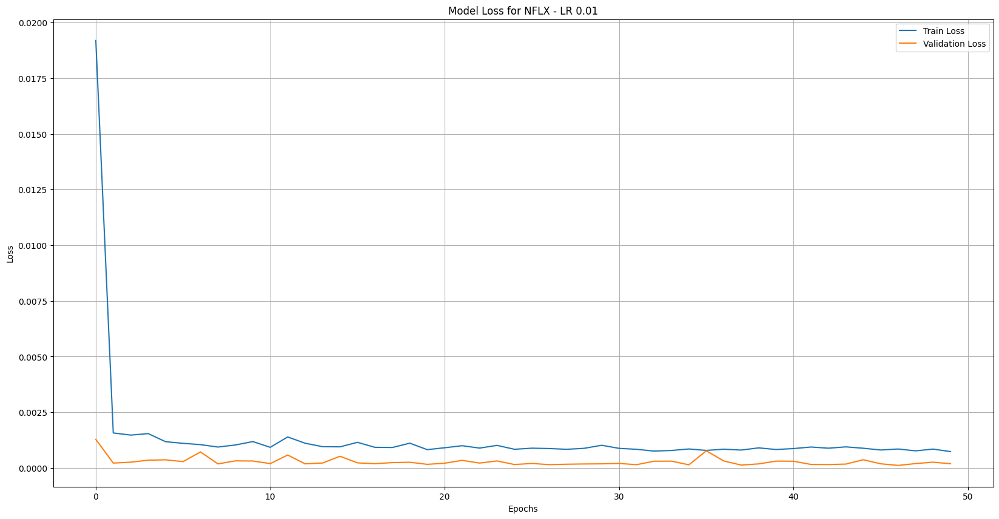

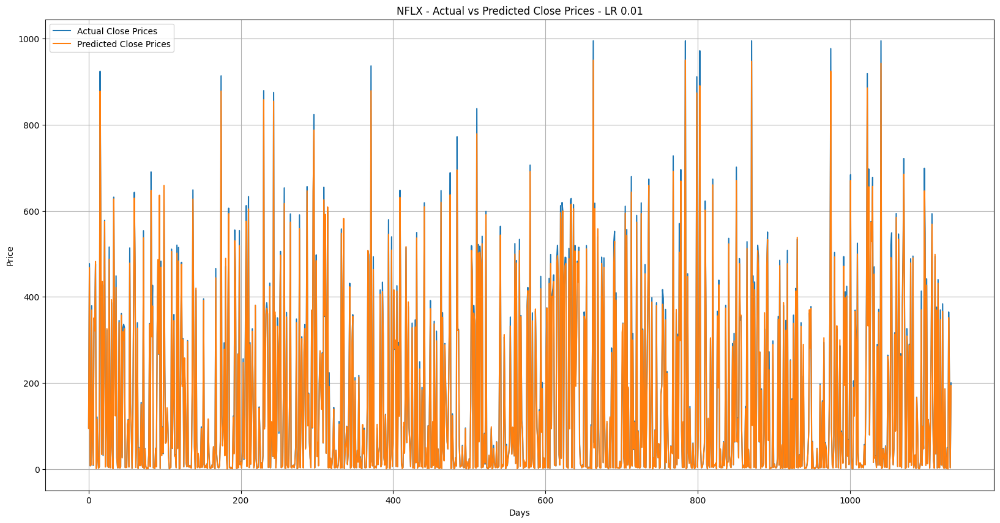

Training with learning rate: 0.1
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 12.4051 - val_loss: 0.1244
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.5525 - val_loss: 0.0462
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0872 - val_loss: 0.0284
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0598 - val_loss: 0.0494
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0694 - val_loss: 0.0431
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0486 - val_loss: 0.0401
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0415 - val_loss: 0.0402
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0364 - val_loss: 0.0279
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0322 - val_loss: 0.0321
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0320 - val_loss: 0.0310
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0327 - val_loss: 0.0380
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0305 - val_

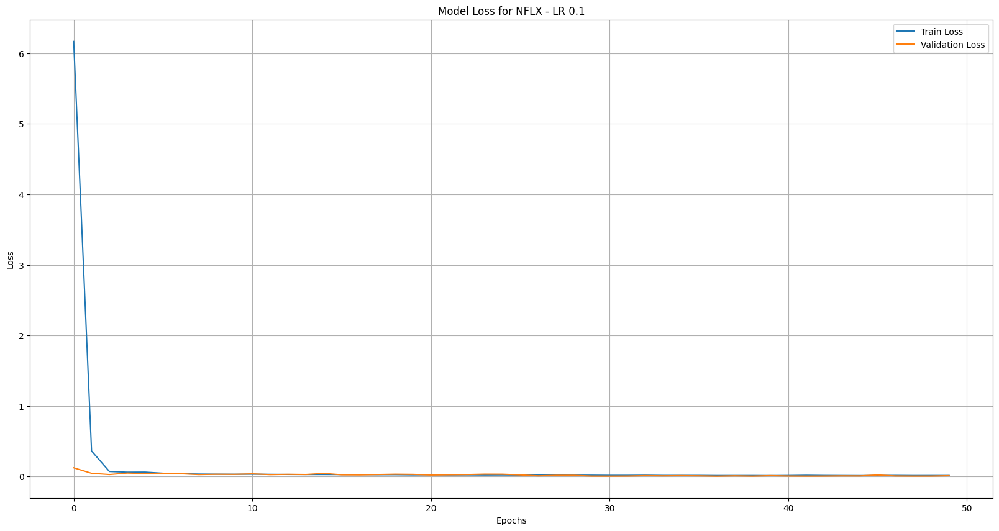

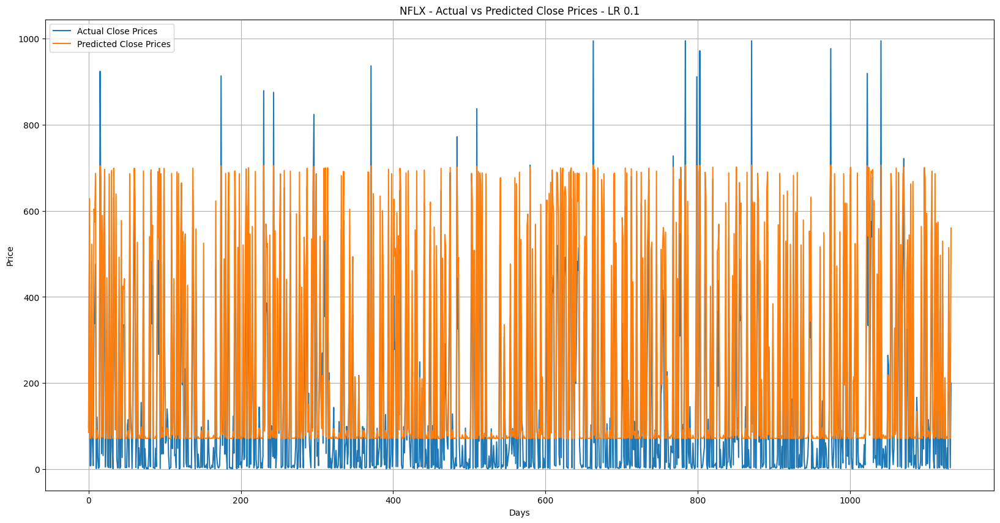

          0.0001      0.0010      0.0100      0.1000
0      95.892807   98.236305   94.551819   85.364388
1     459.961029  466.418335  467.772186  628.054138
2      10.893051   12.302617    7.664353   71.823997
3      11.611727   13.290857    8.764176   72.096924
4     374.287933  373.588226  369.253082  522.729919
...          ...         ...         ...         ...
1129    3.625913    4.931944    0.197993   71.375587
1130  341.052002  349.170868  351.986877  514.765808
1131  184.495575  187.638565  188.110931  192.165924
1132    6.047733    7.548660    2.864932   71.484619
1133  255.515579  201.172241  193.764282  559.889709

[1134 rows x 4 columns]


In [59]:
def fit_lstm_individual(df, look_back=60, epochs=50, batch_size=128, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Netflix.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: NFLX")
    ticker_data = df["Adj Close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # LSTM model
        model = Sequential()
        model.add(LSTM(100, return_sequences=True, input_shape=(look_back, 1)))
        model.add(Dropout(0.5))
        model.add(LSTM(100, return_sequences=False))
        model.add(Dropout(0.5))
        model.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"NFLX - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': model,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for NFLX - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'NFLX - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_lstm_individual(df)
print(prediction)

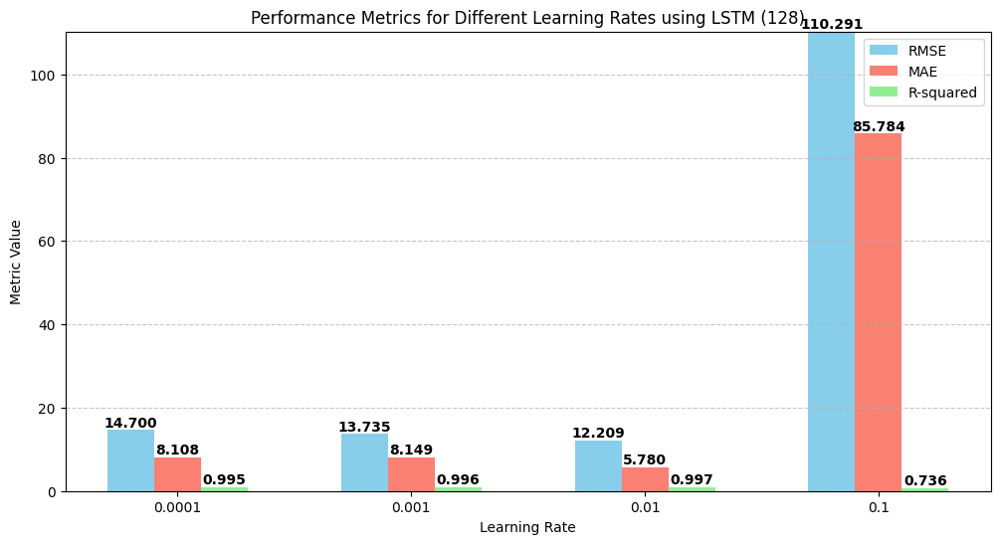

In [60]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(12, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using LSTM (128)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')

ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)

plt.show()

**CNN+GRU-LSTM**

Processing ticker: NFLX
Training with learning rate: 0.0001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.0543 - val_loss: 0.0087
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0067 - val_loss: 7.3542e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0018 - val_loss: 6.7454e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0014 - val_loss: 6.4803e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0015 - val_loss: 5.6466e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0014 - val_loss: 5.3203e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.0012 - val_loss: 5.4014e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0012 - val_loss: 4.8144e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0013 - val_loss: 4.4735e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0012 - val_loss: 4.2534e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.0010 - val_loss: 4.4311e-04
Epoch 12/50
29/29 ━━━

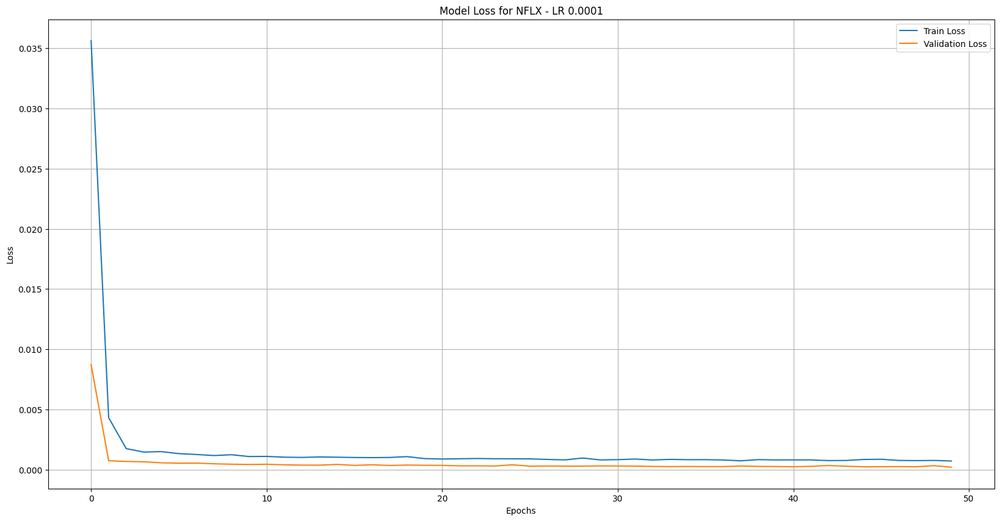

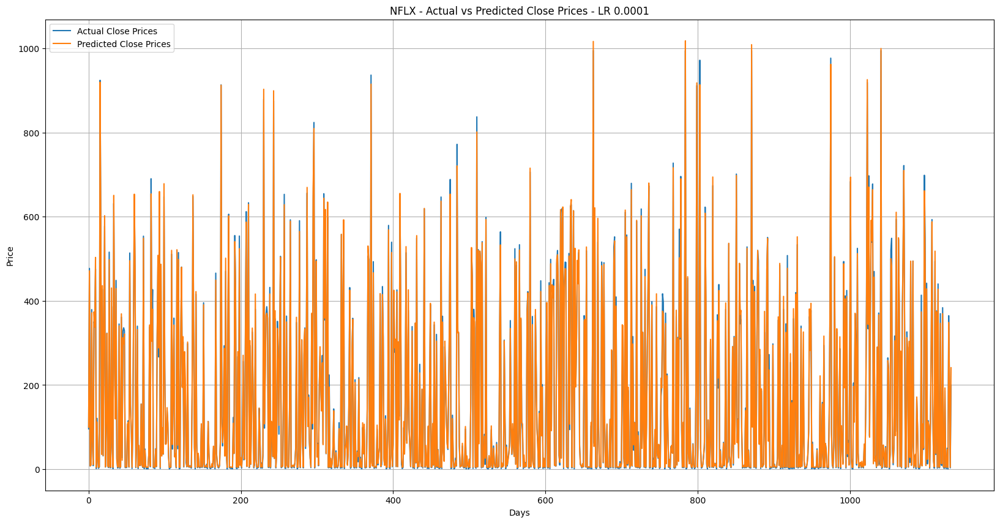

Training with learning rate: 0.001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - loss: 0.0242 - val_loss: 9.7752e-04
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0016 - val_loss: 6.2259e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0011 - val_loss: 4.3846e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0011 - val_loss: 4.6864e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0010 - val_loss: 6.1127e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0012 - val_loss: 3.4000e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 9.3295e-04 - val_loss: 5.8937e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.0629e-04 - val_loss: 2.5416e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.5521e-04 - val_loss: 2.5874e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 9.6603e-04 - val_loss: 2.7912e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.1688e-04 - val_loss: 2.4065e-

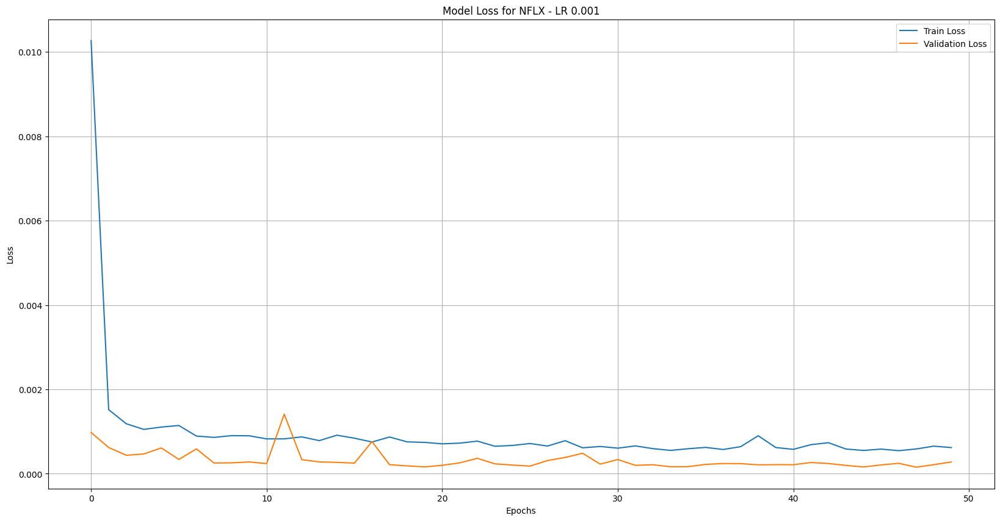

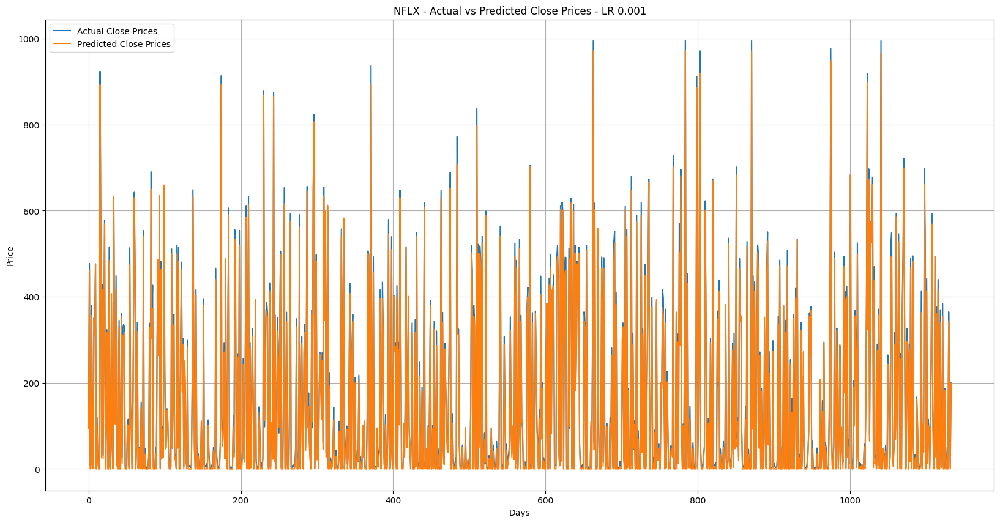

Training with learning rate: 0.01


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 26s 219ms/step - loss: 0.1411 - val_loss: 0.0035
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0034 - val_loss: 8.2126e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0018 - val_loss: 8.8006e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0016 - val_loss: 2.6963e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0011 - val_loss: 2.8100e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0011 - val_loss: 2.9703e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 9.9477e-04 - val_loss: 2.8811e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0012 - val_loss: 3.4381e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 9.5223e-04 - val_loss: 7.8525e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0011 - val_loss: 3.3620e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0011 - val_loss: 5.1582e-04
Epoch 12/50
2

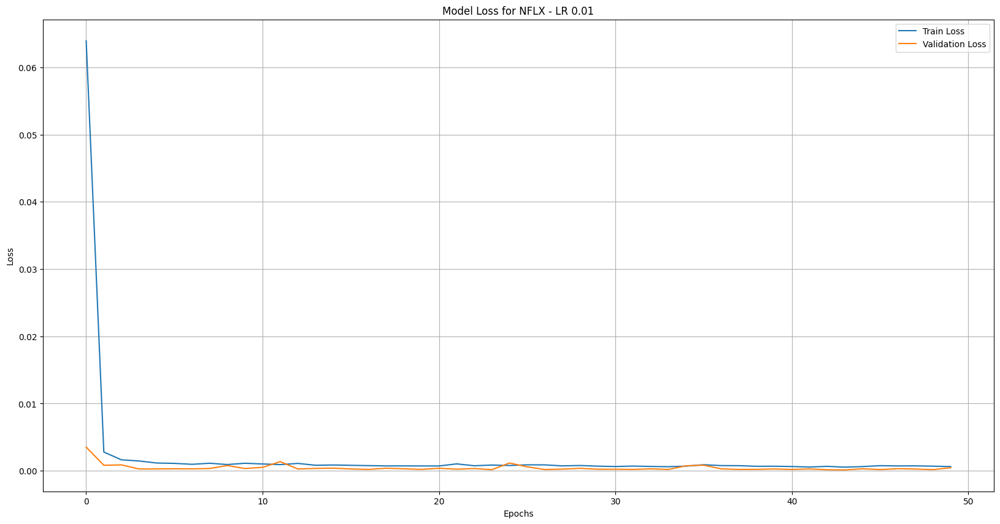

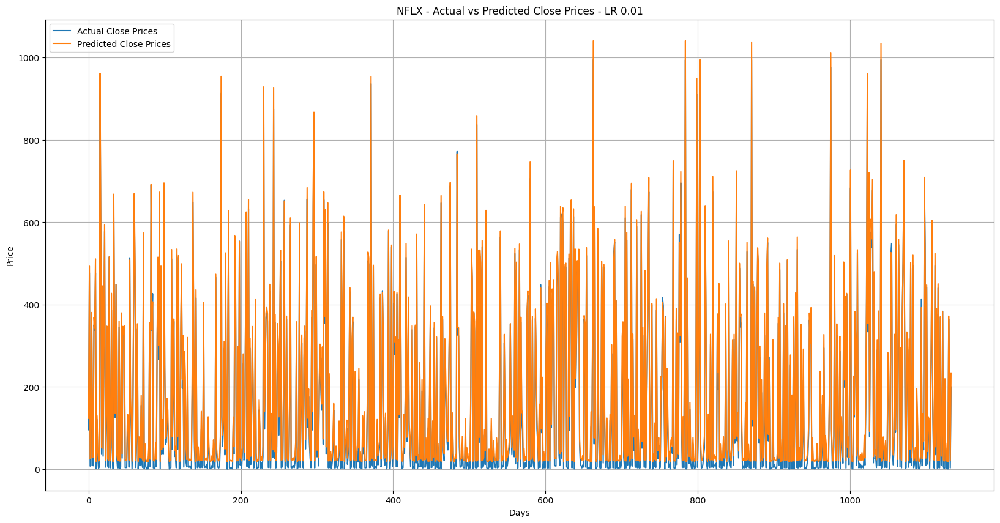

Training with learning rate: 0.1


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 25s 217ms/step - loss: 24.9971 - val_loss: 0.0827
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.5515 - val_loss: 0.0485
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0787 - val_loss: 0.0523
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0688 - val_loss: 0.0701
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0647 - val_loss: 0.0474
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0578 - val_loss: 0.0799
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0725 - val_loss: 0.0515
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0662 - val_loss: 0.0745
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0652 - val_loss: 0.0587
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0558 - val_loss: 0.0480
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0617 - val_loss: 0.0581
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 

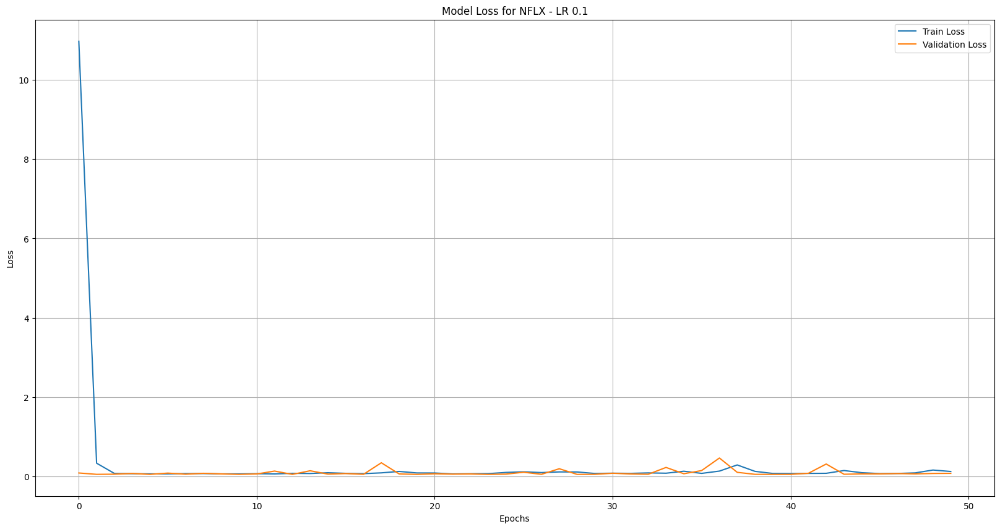

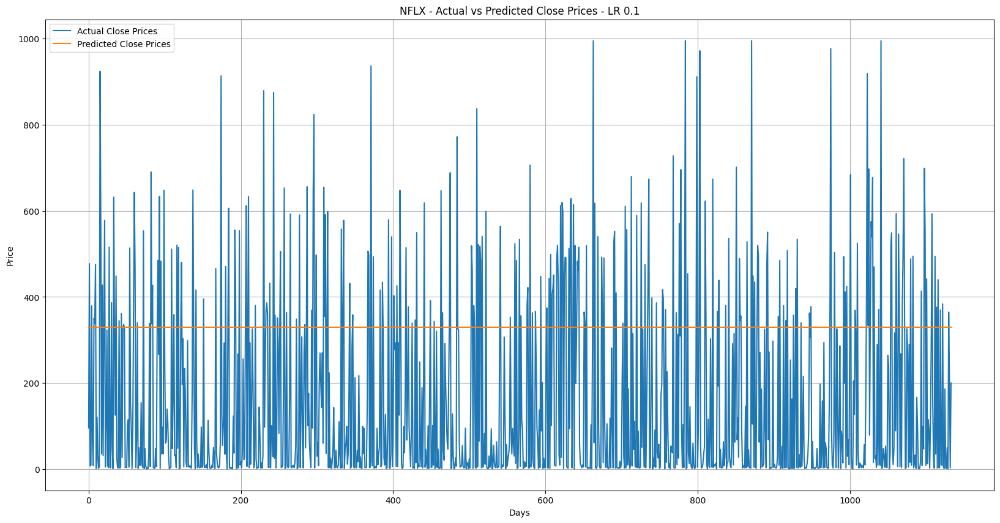

          0.0001      0.0010      0.0100      0.1000
0      99.836708   93.722244  123.678093  329.665405
1     471.445740  460.083740  493.363098  329.665405
2       7.924917   -0.130993   25.330009  329.665405
3       9.452483    0.297045   27.751616  329.665405
4     371.594727  355.931061  380.849579  329.665405
...          ...         ...         ...         ...
1129    4.358231   -0.286557   18.572725  329.665405
1130  348.748444  343.568604  372.126556  329.665405
1131  190.486420  181.683990  221.209534  329.665405
1132    4.910474   -0.295279   20.769836  329.665405
1133  241.137955  198.973602  233.777069  329.665405

[1134 rows x 4 columns]


In [61]:
def fit_cnn_gru_lstm_individual(df, look_back=60, epochs=50, batch_size=128, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+GRU-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Netflix.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: NFLX")
    ticker_data = df["Adj Close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN+GRU-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        cgl= Sequential()
        cgl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        cgl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cgl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        cgl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cgl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        cgl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cgl.add(TimeDistributed(Flatten()))
        cgl.add(Bidirectional(GRU(100, return_sequences=True)))
        cgl.add(Dropout(0.5))
        cgl.add(Bidirectional(LSTM(100, return_sequences=False)))
        cgl.add(Dropout(0.5))
        cgl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        cgl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = cgl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = cgl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"NFLX - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': cgl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for NFLX - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'NFLX - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_gru_lstm_individual(df)
print(prediction)

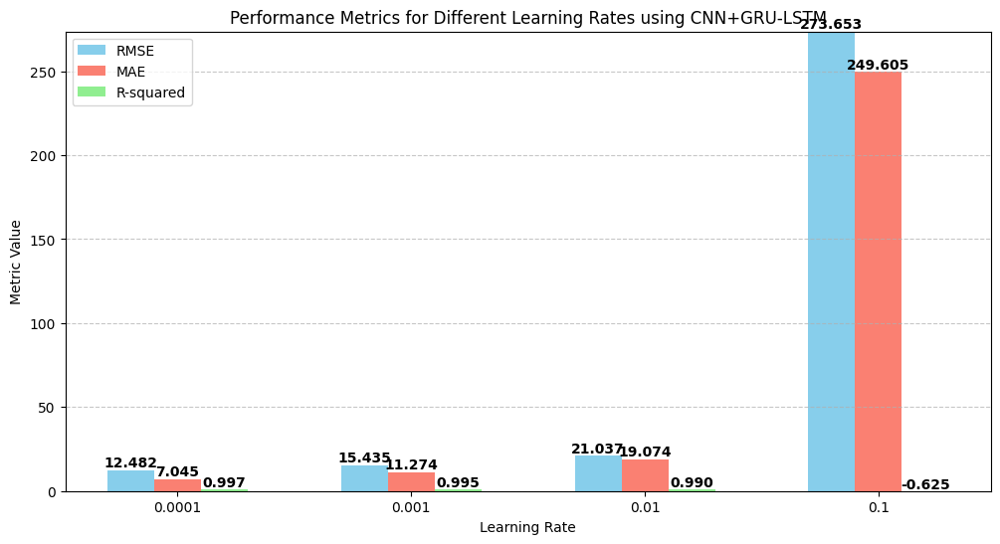

In [62]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(12, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using CNN+GRU-LSTM')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')

ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)

plt.show()

**CNN+Bi-LSTM**

Processing ticker: NFLX
Training with learning rate: 0.0001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 25s 218ms/step - loss: 0.0486 - val_loss: 0.0101
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0077 - val_loss: 9.8720e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.0017 - val_loss: 9.2292e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0017 - val_loss: 8.0267e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0015 - val_loss: 7.6496e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0015 - val_loss: 7.3904e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0015 - val_loss: 7.1334e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0014 - val_loss: 6.1667e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0013 - val_loss: 6.6008e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0012 - val_loss: 5.5794e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0013 - val_loss: 5.4155e-04
Epoch 12/50
29/29 ━━━

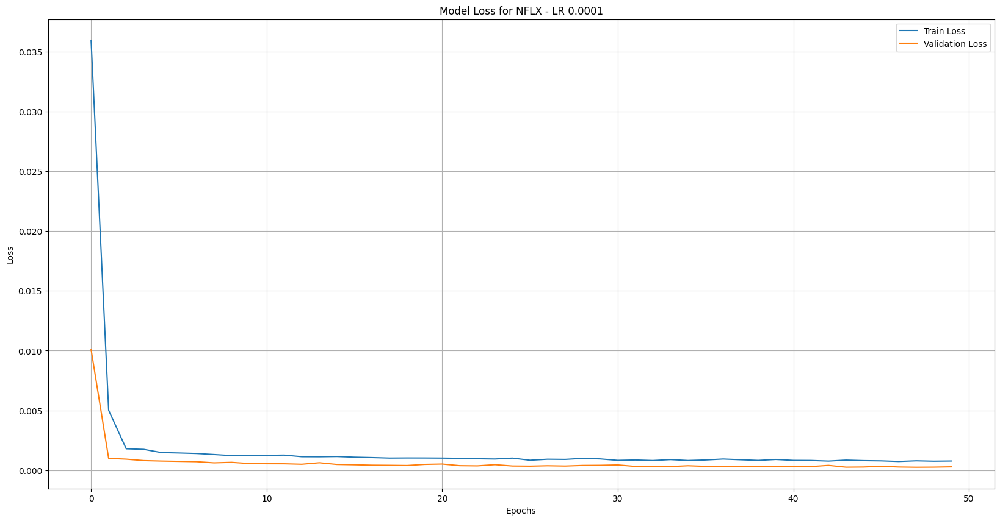

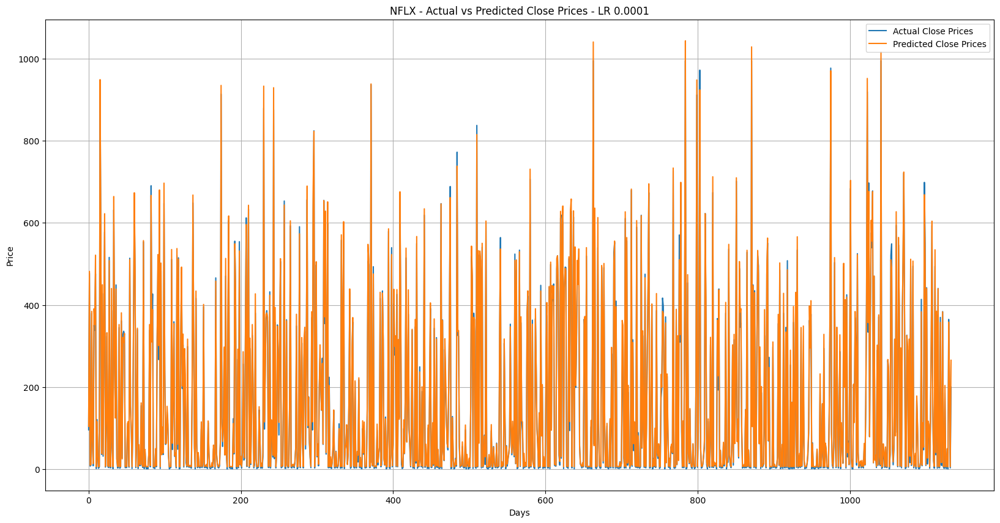

Training with learning rate: 0.001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 24s 212ms/step - loss: 0.0222 - val_loss: 0.0011
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0016 - val_loss: 5.8637e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 9.5174e-04 - val_loss: 4.7556e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0011 - val_loss: 4.0576e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0011 - val_loss: 3.4295e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 8.0999e-04 - val_loss: 6.2074e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0010 - val_loss: 5.1472e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 9.0525e-04 - val_loss: 2.7306e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.5714e-04 - val_loss: 2.7120e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.3720e-04 - val_loss: 2.7326e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.8819e-04 - val_loss: 2.7476e-

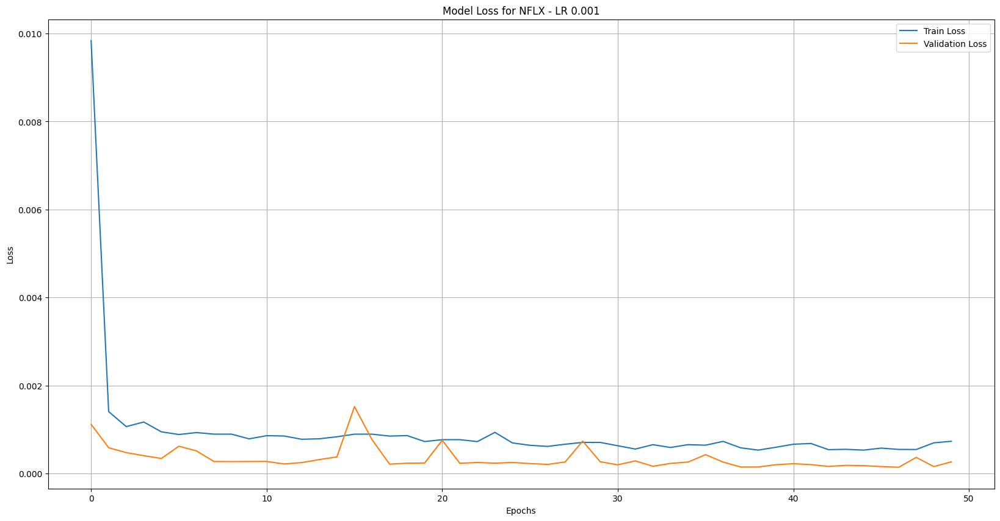

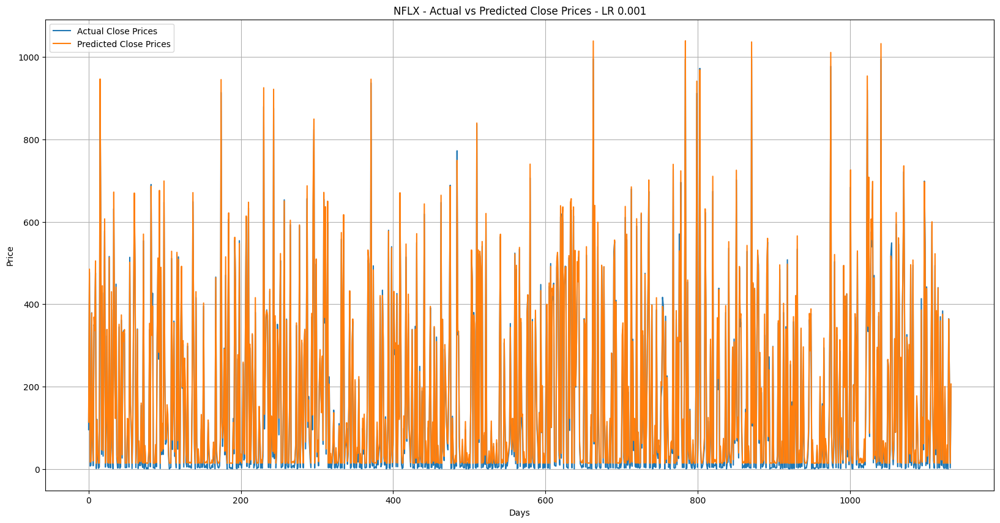

Training with learning rate: 0.01


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 25s 219ms/step - loss: 0.0875 - val_loss: 0.0020
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0024 - val_loss: 5.9762e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0016 - val_loss: 7.8819e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0015 - val_loss: 6.8746e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0011 - val_loss: 3.3980e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0011 - val_loss: 9.4250e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0014 - val_loss: 4.6609e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 9.9492e-04 - val_loss: 2.7906e-04
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0010 - val_loss: 2.7863e-04
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0010 - val_loss: 5.4994e-04
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 8.8611e-04 - val_loss: 7.0630e-04
Epoch 12/50
2

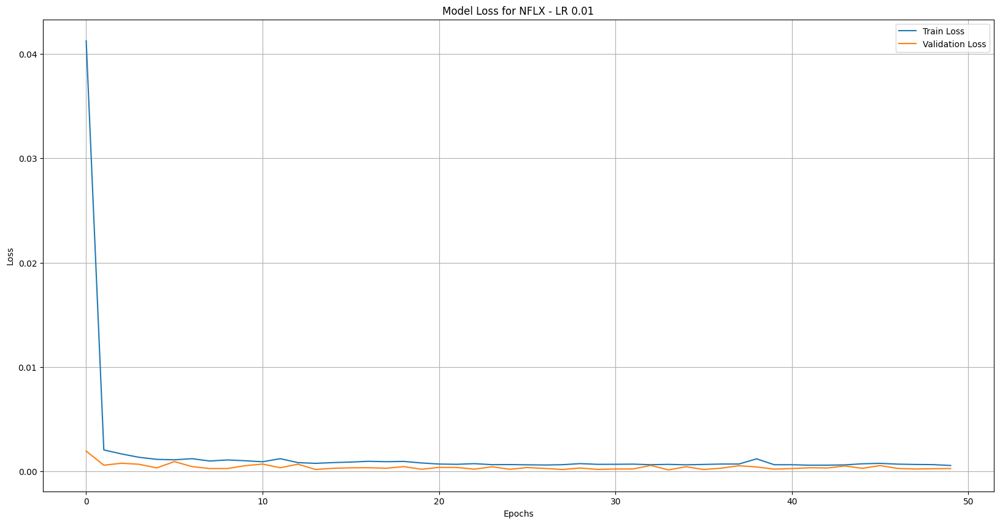

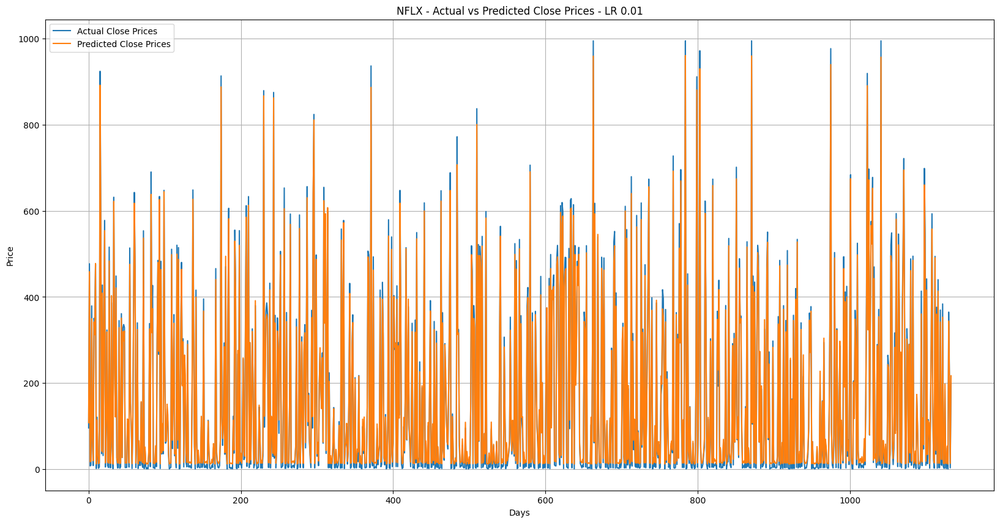

Training with learning rate: 0.1


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 26s 221ms/step - loss: 24.4874 - val_loss: 0.0553
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 1.0781 - val_loss: 0.0508
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0828 - val_loss: 0.0489
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0537 - val_loss: 0.0556
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0527 - val_loss: 0.0491
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0521 - val_loss: 0.0542
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0549 - val_loss: 0.0532
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0527 - val_loss: 0.0520
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0507 - val_loss: 0.0589
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0541 - val_loss: 0.0632
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0580 - val_loss: 0.0527
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 

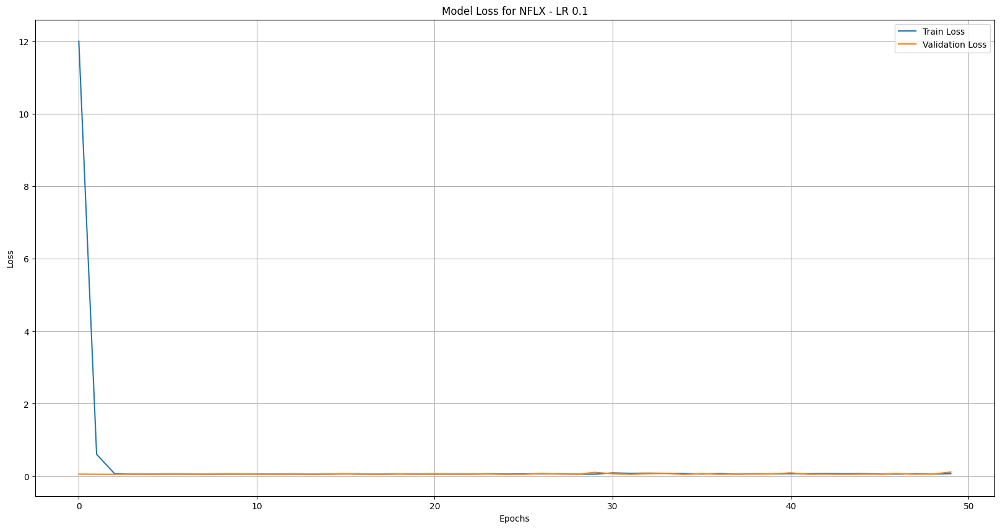

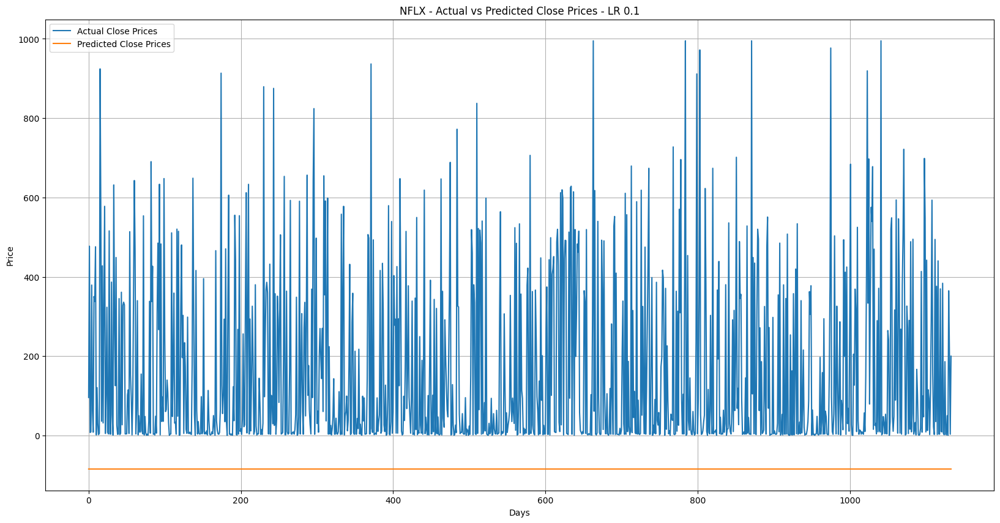

          0.0001      0.0010      0.0100     0.1000
0     104.420212  114.153046  108.000786 -84.412895
1     481.785980  485.100311  458.723907 -84.412895
2       9.758481   17.142879   17.301817 -84.412895
3      11.556898   18.939449   19.105669 -84.412895
4     384.402832  378.672882  349.404938 -84.412895
...          ...         ...         ...        ...
1129    5.886966   14.490087   12.111715 -84.412895
1130  358.025635  363.865662  343.995361 -84.412895
1131  197.780792  199.374466  198.231323 -84.412895
1132    6.256763   14.679513   13.752883 -84.412895
1133  265.291687  206.584106  216.930969 -84.412895

[1134 rows x 4 columns]


In [64]:
def fit_cnn_bi_lstm_individual(df, look_back=60, epochs=50, batch_size=128, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+BI-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Netflix.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: NFLX")
    ticker_data = df["Adj Close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN+Bi-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+Bi-LSTM model
        cl = Sequential()
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Flatten()))
        cl.add(Bidirectional(LSTM(100, return_sequences=True)))
        cl.add(Dropout(0.5))
        cl.add(Bidirectional(LSTM(100, return_sequences=False)))
        cl.add(Dropout(0.5))
        cl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        cl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = cl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = cl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"NFLX - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': cl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for NFLX - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'NFLX - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_bi_lstm_individual(df)
print(prediction)

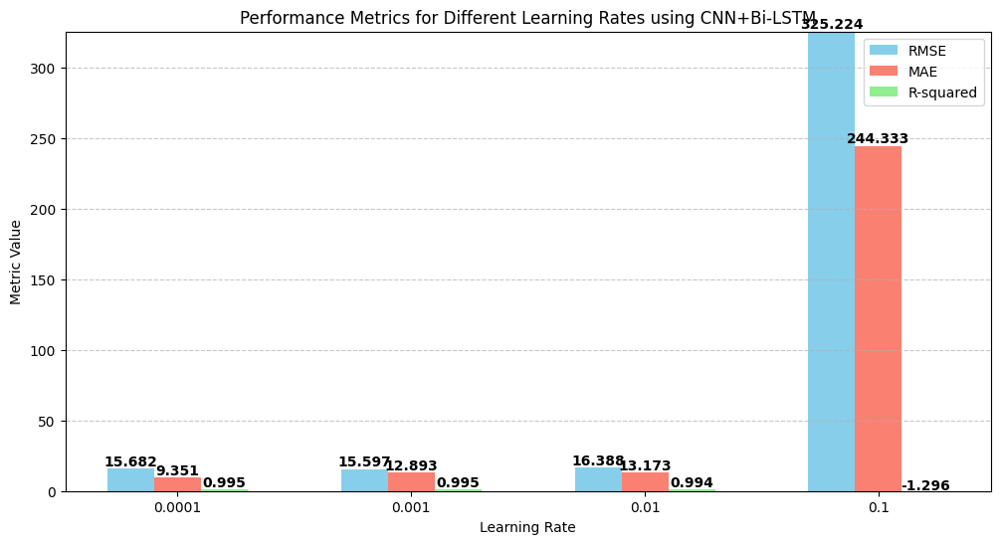

In [65]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(12, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using CNN+Bi-LSTM')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')

ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)

plt.show()